# Analyse of the properties of 8 tubes containing various concentrations of mouthwash and sugar

In this notebook, we tested the susceptibility impact on water and the $T_2^*$ values of each different solutions 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cmath
import nibabel as nib
import cv2
from sklearn.linear_model import LinearRegression 
import scipy
import scipy.io
from skimage.transform import rescale as resc
from skimage.transform import downscale_local_mean
import plotly.graph_objects as go
from scipy.io import savemat
from scipy.ndimage import gaussian_filter
import tqdm
import tikzplotlib
from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec
from PIL import Image
from scipy import stats
from statsmodels.stats.weightstats import DescrStatsW

# I. Field maps 

In [2]:
### parameters and constants
TE1=3.06*0.001 #s
TE2=4.08*0.001 #s
delta_TE=TE2-TE1
gamma = 2.675221900e8 # /s/T

In [3]:
def mask(path_mag1, material, tresh, plot=True, slice=71):
    '''
    Return a mask with 0 if inside the compound and 1 outside

    Parameters
    ----------
    path_mag1 : str
        path to the magnitude 1 of the compound.
    material : str
        description of the compound.
    tresh : float
        magnitude treshold of the mask.
    plot : bool, optional
        if true, plot a slice of the magnitude and of the mask. The default is True.
    slice : int, optional
        the slice to plot. The default is 71.

    Returns
    -------
    mask : numpy.ndarray
        mask of the compound.

    '''
    ######## magnitude #############
    mag1 = nib.load(path_mag1)
    data_mag1=mag1.get_fdata() #extract matrix with values
    
    mask = data_mag1 > tresh #return array of booleens
    
    
    #plot the selected slice 
    if plot==True:
        plt.figure(figsize=(8,5))
        plt.subplot(1,2,1)
        plt.imshow(data_mag1[:,:,slice])
        plt.colorbar()
        plt.title(f'Magnitude_1 of {material}')
    
        plt.subplot(1,2,2)
        plt.imshow(mask[:, :, slice])
        plt.colorbar()
        plt.title(f'mask of {material}')
    
        plt.tight_layout()
    #return matrix of delta_B
    return mask

In [4]:
def rescale(path_mag1, path_phase, material, deltaTE=delta_TE, slice=80, masking=True):
    '''
    Rescale the acquired phase difference to a field map in Hz.
    
    Rescale from the phase difference in 2^13 bits to a field map in Hz, and plot the magnitude, phase difference and field map.
    If masking = True then put values inside the compound at zero.


    Parameters
    ----------
    path_mag1 : str
        path to the first magnitude.
    path_phase : str
        path to the phase difference.
    material : str
        description of the compound.
    deltaTE : float
        TE2-TE1.
    slice : int, optional
        Slice to plot. The default is 80.
    masking : bool, optional
        apply the mask of the magnitude to the field map. The default is True.

    Returns
    -------
    data_phase : numpy.ndarray
        rescaled field map in Hz.

    '''
    ######## magnitude #############
    data_mag1=nib.load(path_mag1).get_fdata() #extract matrix with values of magnitude 1
    
    #plot the selected slice of the magnitude
    plt.figure('f{material}', figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(data_mag1[:,:,slice])
    plt.colorbar()
    plt.title(f'Magnitude_1 of {material}')
    
    
    ########### phase difference and field map ############
    data_phase = nib.load(path_phase).get_fdata() #extract matrix with values
    
    #rescaling:a
    data_phase *= np.pi/4096 #set the phase between -pi and pi
    data_phase /= (deltaTE*2*np.pi) #in Hz
    #data_phase /= gamma # in T
    
    # apply the mask if needed
    if masking==True:
        maske=mask(path_mag1, material, 400, plot=False, slice=slice)
        data_phase *= maske
    
    
    #plot the selected slice of field map
    plt.subplot(1,2,2)
    plt.imshow(data_phase[:,:,slice])
    plt.colorbar()
    plt.title(f'Field map (Hz) of {material}')
    plt.show()
    
    plt.tight_layout()
    
    #return matrix of delta_B
    return data_phase #return field map

## Loading the data

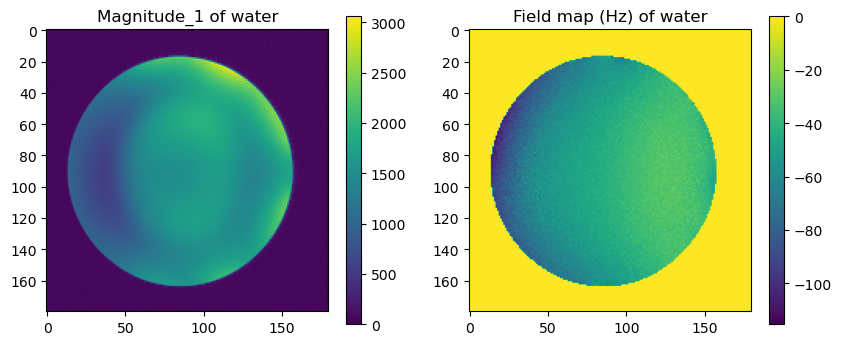

<Figure size 640x480 with 0 Axes>

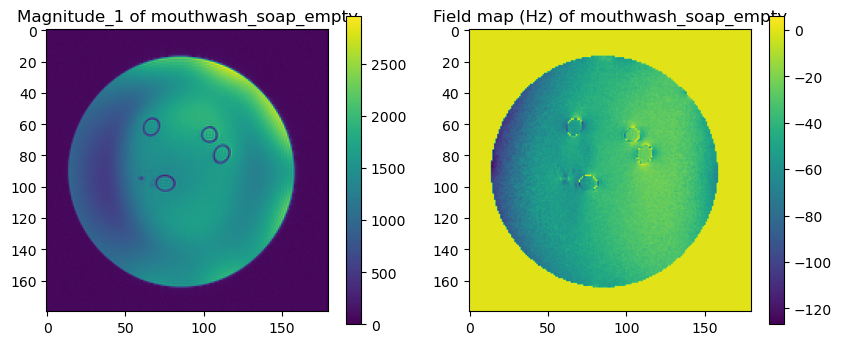

<Figure size 640x480 with 0 Axes>

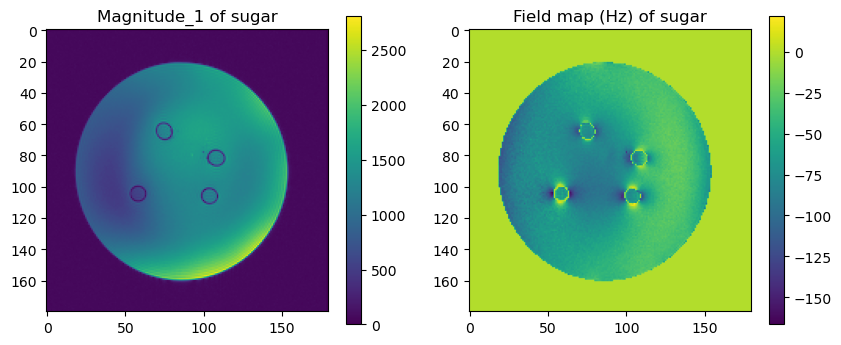

<Figure size 640x480 with 0 Axes>

In [5]:
# water + salt reference background
path_mag1_water = r"JOHANNA_BRUNNHILDE_20230224\FM_REFERENCE_0002\FM_REFERENCE_0002_fm_reference_20230224095347_2_e1.nii.gz"
path_phase_water = r"JOHANNA_BRUNNHILDE_20230224\FM_REFERENCE_0003\FM_REFERENCE_0003_fm_reference_20230224095347_3_e2_ph.nii.gz"
delta_B_water = rescale(path_mag1_water, path_phase_water, "water", delta_TE, masking=True, slice=80)

#water + mouthwash1 
path_mag1_mouthwash_soap_empty = r"JOHANNA_BRUNNHILDE_20230224\FM_MOUTHWASH_SOAP_EMPTY_0005\FM_MOUTHWASH_SOAP_EMPTY_0005_fm_Mouthwash_soap_empty_20230224095347_5_e1.nii.gz"
path_phase_mouthwash_soap_empty = r"JOHANNA_BRUNNHILDE_20230224\FM_MOUTHWASH_SOAP_EMPTY_0006\FM_MOUTHWASH_SOAP_EMPTY_0006_fm_Mouthwash_soap_empty_20230224095347_6_e2_ph.nii.gz"
delta_B_mouthwash_soap_empty = rescale(path_mag1_mouthwash_soap_empty, path_phase_mouthwash_soap_empty, "mouthwash_soap_empty", delta_TE, masking=True, slice=75)

#water + sugar 
path_mag1_sugar = r"JOHANNA_BRUNNHILDE_20230224\FM_SUGAR_0018\FM_SUGAR_0018_fm_sugar_20230224095347_18_e1.nii.gz"
path_phase_sugar = r"JOHANNA_BRUNNHILDE_20230224\FM_SUGAR_0019\FM_SUGAR_0019_fm_sugar_20230224095347_19_e2_ph.nii.gz"
delta_B_sugar = rescale(path_mag1_sugar, path_phase_sugar, "sugar", delta_TE, masking=True, slice=50)

### Localisation of each sample
* For the mouthwash ad soap and empty solutions
    - top left: soap
    - top right: mouthwash 1 (with alcohol)
    - bottom left: empty (blank)
    - bottom right: mouthwash 2

* For the sugar solutions
    - top left: C1=350g/L sugar
    - top right: C2=550g/L sugar
    - bottom left: C3=750g/L suhar
    - bottom right: sugar (30mg) + mouthwash2 (2.4mL) + salt (1g) + 40mL water

### Masks

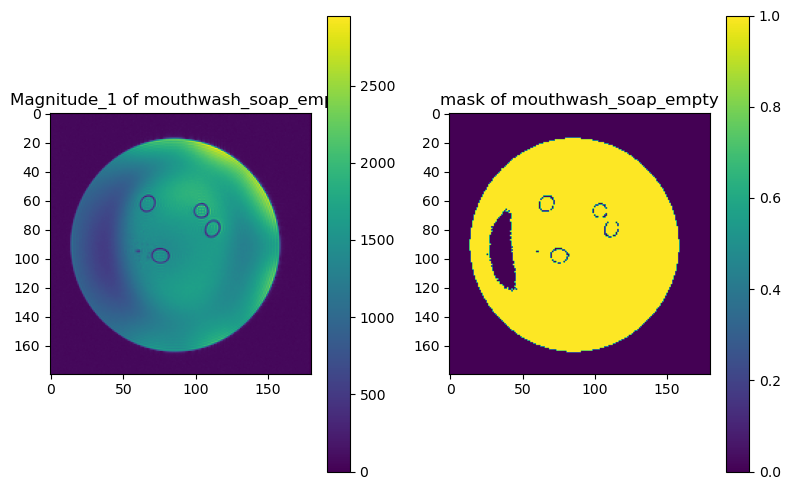

In [6]:
mask_mouthwash_soap_empty = mask(path_mag1_mouthwash_soap_empty, 'mouthwash_soap_empty', tresh=650, plot=True, slice=75)

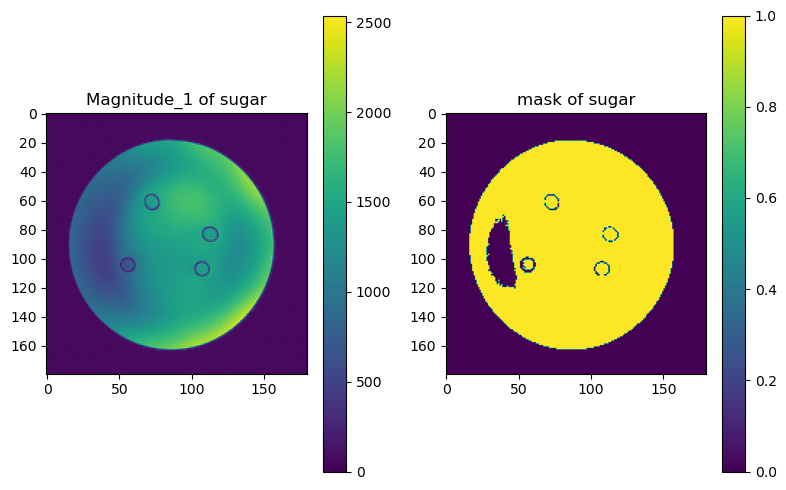

In [7]:
mask_sugar = mask(path_mag1_sugar, 'sugar', tresh=600, plot=True, slice=60)

### Correction of the background by removing the reference backgrund and recentering 

In [8]:
fm_mouthwash_soap_empty_corr1 = delta_B_mouthwash_soap_empty -  gaussian_filter(delta_B_water, sigma=2)
fm_sugar_corr1 = delta_B_sugar -  gaussian_filter(delta_B_water, sigma=2)


avg_backg_mouthwash_soap_empty = np.average(fm_mouthwash_soap_empty_corr1, weights = mask_mouthwash_soap_empty)
print(f'The average background of the fm of the mouthwash_soap_empty, backgound corrected, is {avg_backg_mouthwash_soap_empty}')
fm_mouthwash_soap_empty_final = (fm_mouthwash_soap_empty_corr1 - avg_backg_mouthwash_soap_empty)*mask_mouthwash_soap_empty

avg_backg_sugar = np.average(fm_sugar_corr1, weights = mask_sugar)
print(f'The average background of the fm of the sugar, backgound corrected, is {avg_backg_sugar}')
fm_sugar_final = (fm_sugar_corr1 - avg_backg_sugar)*mask_sugar

The average background of the fm of the mouthwash_soap_empty, backgound corrected, is 4.1579172657228485
The average background of the fm of the sugar, backgound corrected, is -3.87681590604819


C:\Users\b\AppData\Local\Temp\ipykernel_21280\1767689696.py:6: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar()


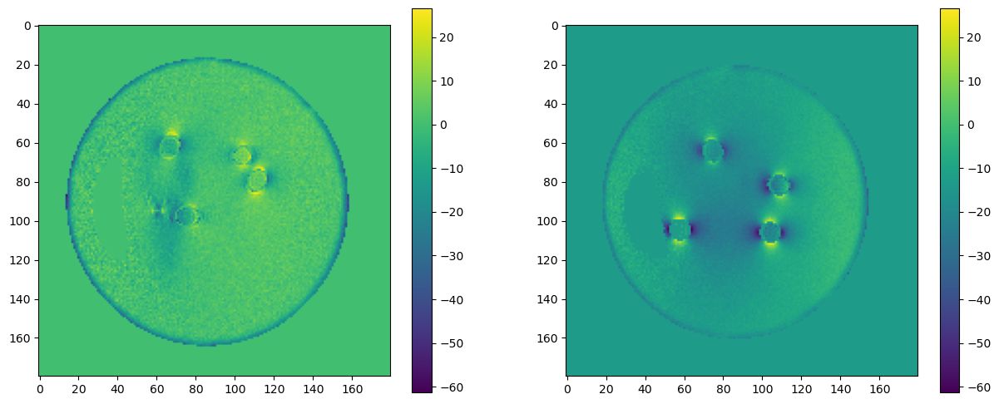

In [9]:
plt.figure(figsize=(15,6))
plt.subplot(121)
plt.imshow(fm_mouthwash_soap_empty_final[:,:,75])
plt.colorbar()
plt.subplot(122)
plt.colorbar()
plt.imshow(fm_sugar_final[:,:,51])

In [10]:
###### Coordinates of the center of each sample "#######"
### Mouthwaash 1 2 soap and empty ###
x_mouthwash1, y_mouthwash1, z_mouthwash1 = 103, 67, 75
x_mouthwash2, y_mouthwash2, z_mouthwash2 = 112, 79, 75
x_soap, y_soap, z_soap = 67, 62, 75
x_empty, y_empty, z_empty = 75, 98, 75

### Sugar ###
x_sugar_c1, y_sugar_c1, z_sugar_c1 = 75, 65, 51
x_sugar_c2, y_sugar_c2, z_sugar_c2 = 109, 82, 51
x_sugar_c3, y_sugar_c3, z_sugar_c3 = 59, 104, 51
x_melange, y_melange, z_melange = 105, 106, 51

dx, dy, dz = 10, 10, 10
###########################################################""

C:\Users\b\AppData\Local\Temp\ipykernel_21280\1647713098.py:21: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar()


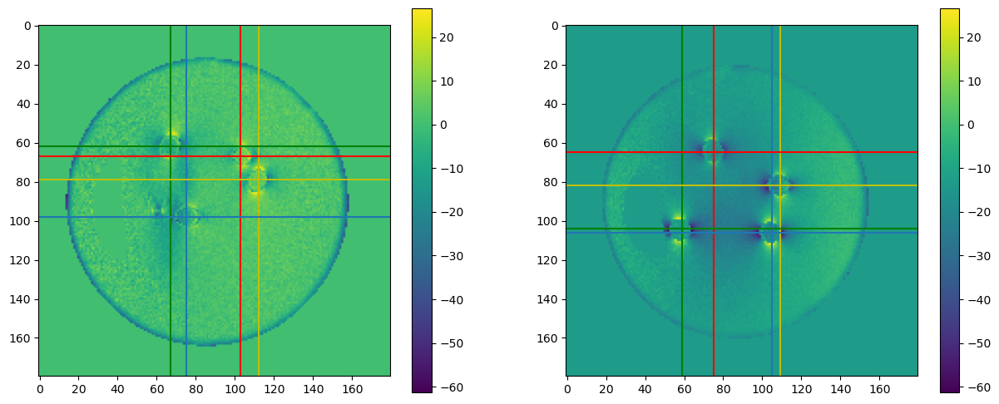

In [11]:
### Mouthwaash 1 2 soap and empty ###

plt.figure(figsize=(15,6))
plt.subplot(121)
plt.imshow(fm_mouthwash_soap_empty_final[:,:,z_soap])

plt.axvline(x=x_mouthwash1, c='r')
plt.axvline(x=x_mouthwash2, c='y')
plt.axvline(x=x_soap, c='g')
plt.axvline(x=x_empty)

plt.axhline(y=y_mouthwash1, c='r')
plt.axhline(y=y_mouthwash2, c='y')
plt.axhline(y=y_soap, c='g')
plt.axhline(y=y_empty)
plt.colorbar()


### Sugar ###
plt.subplot(122)
plt.colorbar()
plt.imshow(fm_sugar_final[:,:,z_sugar_c1])

plt.axvline(x=x_sugar_c1, c='r')
plt.axvline(x=x_sugar_c2, c='y')
plt.axvline(x=x_sugar_c3, c='g')
plt.axvline(x=x_melange)

plt.axhline(y=y_sugar_c1, c='r')
plt.axhline(y=y_sugar_c2, c='y')
plt.axhline(y=y_sugar_c3, c='g')
plt.axhline(y=y_melange)

In [12]:
def rescaling_FOV(field_map, x, y, z, dx=dx, dy=dy, dz=dz):
    '''
    Reshape field_map to a smaller array

    Create a new smaller matrix of volume 2dx*2dy*2dz with values recentered on x,y,z
    Attention: x is the second component and y the first one.

    Parameters
    ----------
    field_map : numpy.ndarray
        3D array pf the FM to reshape.
    x : int
        x coordinate around which field_map will be reshaped
    y : int
        y coordinate around which field_map will be reshaped
    z : int
        z coordinate around which field_map will be reshaped
    dx : int, optional
        0.5*width along the x direction of the reshaped matrix. The default is dx.
    dy : int, optional
        0.5*width along the y direction of the reshaped matrix. The default is dy.
    dz : int, optional
        0.5*width along the z direction of the reshaped matrix. The default is dz.
            
    Returns
    -------
    rescaled_matrix : numpy.ndarray
        Reshaped 3D array.

    '''
    rescaled_matrix= field_map[y-dy:y+dy+1, x-dx:x+dx+1, z-dz: z+dz+1] 
   
    return rescaled_matrix

In [13]:
fm_mouthwash1 = rescaling_FOV(fm_mouthwash_soap_empty_final, x=x_mouthwash1, y=y_mouthwash1, z=z_mouthwash1, dx=dx, dy=dy, dz=dz)
fm_mouthwash2 = rescaling_FOV(fm_mouthwash_soap_empty_final, x=x_mouthwash2, y=y_mouthwash2, z=z_mouthwash2, dx=dx, dy=dy, dz=dz)
fm_empty = rescaling_FOV(fm_mouthwash_soap_empty_final, x=x_empty, y=y_empty, z=z_empty, dx=dx, dy=dy, dz=dz)
fm_soap = rescaling_FOV(fm_mouthwash_soap_empty_final, x=x_soap, y=y_soap, z=z_soap, dx=dx, dy=dy, dz=dz)

fm_sugar_c1 = rescaling_FOV(fm_sugar_final, x=x_sugar_c1, y=y_sugar_c1, z=z_sugar_c1, dx=dx, dy=dy, dz=dz)
fm_sugar_c2 = rescaling_FOV(fm_sugar_final, x=x_sugar_c2, y=y_sugar_c2, z=z_sugar_c2, dx=dx, dy=dy, dz=dz)
fm_sugar_c3 = rescaling_FOV(fm_sugar_final, x=x_sugar_c3, y=y_sugar_c3, z=z_sugar_c3, dx=dx, dy=dy, dz=dz)
fm_melange = rescaling_FOV(fm_sugar_final, x=x_melange, y=y_melange, z=z_melange, dx=dx, dy=dy, dz=dz)


mask_mouthwash1 = rescaling_FOV(mask_mouthwash_soap_empty, x=x_mouthwash1, y=y_mouthwash1, z=z_mouthwash1, dx=dx, dy=dy, dz=dz)
mask_mouthwash2 = rescaling_FOV(mask_mouthwash_soap_empty, x=x_mouthwash2, y=y_mouthwash2, z=z_mouthwash2, dx=dx, dy=dy, dz=dz)
mask_empty = rescaling_FOV(mask_mouthwash_soap_empty, x=x_empty, y=y_empty, z=z_empty, dx=dx, dy=dy, dz=dz)
mask_soap = rescaling_FOV(mask_mouthwash_soap_empty, x=x_soap, y=y_soap, z=z_soap, dx=dx, dy=dy, dz=dz)

mask_sugar_c1 = rescaling_FOV(mask_sugar, x=x_sugar_c1, y=y_sugar_c1, z=z_sugar_c1, dx=dx, dy=dy, dz=dz)
mask_sugar_c2 = rescaling_FOV(mask_sugar, x=x_sugar_c2, y=y_sugar_c2, z=z_sugar_c2, dx=dx, dy=dy, dz=dz)
mask_sugar_c3 = rescaling_FOV(mask_sugar, x=x_sugar_c3, y=y_sugar_c3, z=z_sugar_c3, dx=dx, dy=dy, dz=dz)
mask_melange = rescaling_FOV(mask_sugar, x=x_melange, y=y_melange, z=z_melange, dx=dx, dy=dy, dz=dz)


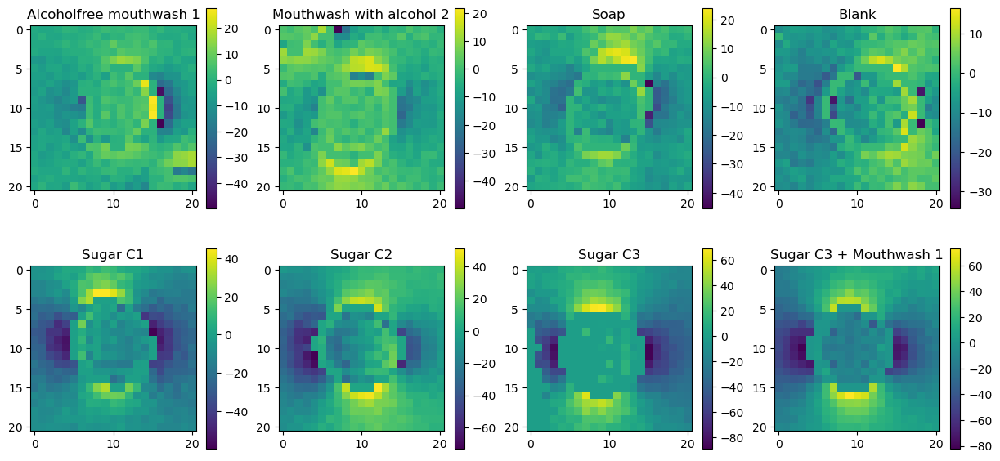

(21, 21, 21)


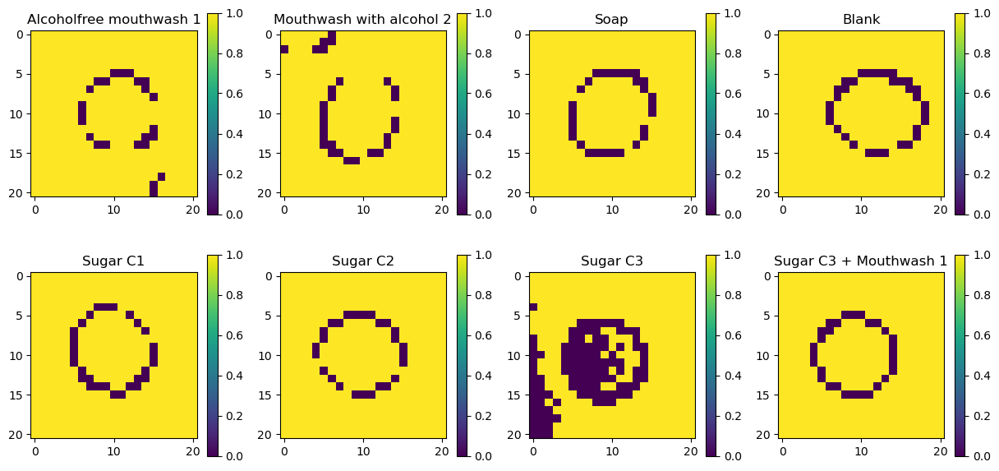

In [14]:
plt.figure(figsize=(15,7))
plt.subplot(241)
plt.imshow(fm_mouthwash1[:,:,9])
plt.colorbar()
plt.title('Alcoholfree mouthwash 1')
plt.subplot(242)
plt.imshow(fm_mouthwash2[:,:,9])
plt.colorbar()
plt.title('Mouthwash with alcohol 2')
plt.subplot(243)
plt.imshow(fm_soap[:,:,10])
plt.colorbar()
plt.title('Soap')
plt.subplot(244)
plt.imshow(fm_empty[:,:,12])
plt.colorbar()
plt.title('Blank')
plt.subplot(245)
plt.imshow(fm_sugar_c1[:,:,10])
plt.colorbar()
plt.title('Sugar C1')
plt.subplot(246)
plt.imshow(fm_sugar_c2[:,:,10])
plt.colorbar()
plt.title('Sugar C2')
plt.subplot(247)
plt.imshow(fm_sugar_c3[:,:,10])
plt.colorbar()
plt.title('Sugar C3')
plt.subplot(248)
plt.imshow(fm_melange[:,:,10])
plt.colorbar()
plt.title('Sugar C3 + Mouthwash 1')
tikzplotlib.save(r"figures\field_maps_8contrast_agents.tex")
plt.show()


plt.figure(figsize=(15,7))
plt.subplot(241)
plt.imshow(mask_mouthwash1[:,:,10])
plt.colorbar()
plt.title('Alcoholfree mouthwash 1')
plt.subplot(242)
plt.imshow(mask_mouthwash2[:,:,10])
plt.colorbar()
plt.title('Mouthwash with alcohol 2')
plt.subplot(243)
plt.imshow(mask_soap[:,:,10])
plt.colorbar()
plt.title('Soap')
plt.subplot(244)
plt.imshow(mask_empty[:,:,12])
plt.colorbar()
plt.title('Blank')
plt.subplot(245)
plt.imshow(mask_sugar_c1[:,:,10])
plt.colorbar()
plt.title('Sugar C1')
plt.subplot(246)
plt.imshow(mask_sugar_c2[:,:,10])
plt.colorbar()
plt.title('Sugar C2')
plt.subplot(247)
plt.imshow(mask_sugar_c3[:,:,10])
plt.colorbar()
plt.title('Sugar C3')
plt.subplot(248)
plt.imshow(mask_melange[:,:,10])
plt.colorbar()
plt.title('Sugar C3 + Mouthwash 1')



print(np.shape(mask_sugar_c1))

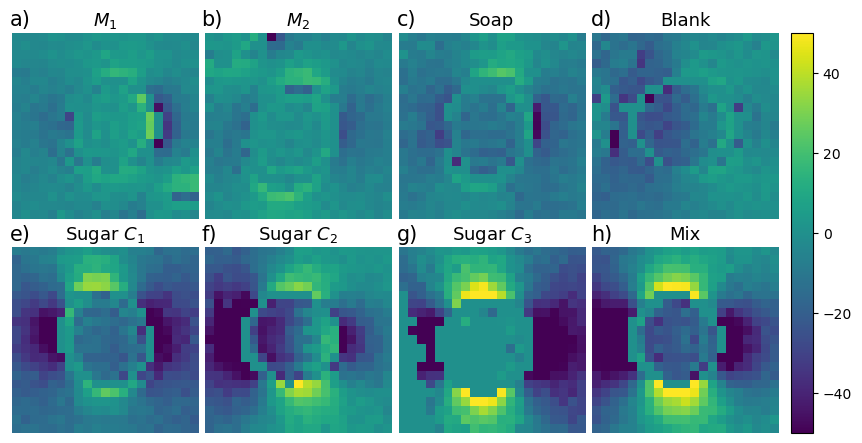

In [15]:
'x = coordinate of the slices we want'
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(11, 5))
c=0
vmin=-50
vmax=50
im = axes[0][0].imshow(fm_mouthwash1[:,:,9], vmin=vmin, vmax=vmax)
axes[0][0].axis('off')
axes[0][0].set_title('$M_1$', size=13)

im = axes[0][1].imshow(fm_mouthwash2[:,:,9], vmin=vmin, vmax=vmax)
axes[0][1].axis('off')
axes[0][1].set_title('$M_2$', size=13)

im = axes[0][2].imshow(fm_soap[:,:,9], vmin=vmin, vmax=vmax)
axes[0][2].axis('off')
axes[0][2].set_title('Soap', size=13)

im = axes[0][3].imshow(fm_empty[:,:,9], vmin=vmin, vmax=vmax)
axes[0][3].axis('off')
axes[0][3].set_title('Blank', size=13)

im = axes[1][0].imshow(fm_sugar_c1[:,:,9], vmin=vmin, vmax=vmax)
axes[1][0].axis('off')
axes[1][0].set_title('Sugar $C_1$', size=13)

im = axes[1][1].imshow(fm_sugar_c2[:,:,9], vmin=vmin, vmax=vmax)
axes[1][1].axis('off')
axes[1][1].set_title('Sugar $C_2$', size=13)

im = axes[1][2].imshow(fm_sugar_c3[:,:,9], vmin=vmin, vmax=vmax)
axes[1][2].axis('off')
axes[1][2].set_title('Sugar $C_3$', size=13)

im = axes[1][3].imshow(fm_melange[:,:,9], vmin=vmin, vmax=vmax)
axes[1][3].axis('off')
axes[1][3].set_title('Mix', size=13)



fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.15)

# add an axes, lower left corner in [0.83, 0.1] measured in figure coordinate with axes width 0.02 and height 0.8
cb_ax = fig.add_axes([0.81, 0.1, 0.02, 0.8])
cbar = fig.colorbar(im, cax=cb_ax)

#### letter
plt.text(x= -35.5 ,y=52, s='a)', size=15)
plt.text(x= -26.8 ,y=52, s='b)', size=15)
plt.text(x= -17.9 ,y=52, s='c)', size=15)
plt.text(x= -9.1,y=52, s='d)', size=15)
plt.text(x= -35.5 ,y=-1.8, s='e)', size=15)
plt.text(x= -26.8 ,y=-1.8, s='f)', size=15)
plt.text(x= -17.9 ,y=-1.8, s='g)', size=15)
plt.text(x= -9.1,y=-1.8, s='h)', size=15)


# plt.savefig(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\tests materiaux\230224_test5_sugar_mouthwash\figures\8fm_contrastagents.png")





plt.show()
  

### Simu

In [16]:
maskMoi = scipy.io.loadmat(r"I_mask_test5_cylinder.mat")
simuMoi = scipy.io.loadmat(r"I_sus_simu_test5_cylinder.mat")

(21, 21, 21)


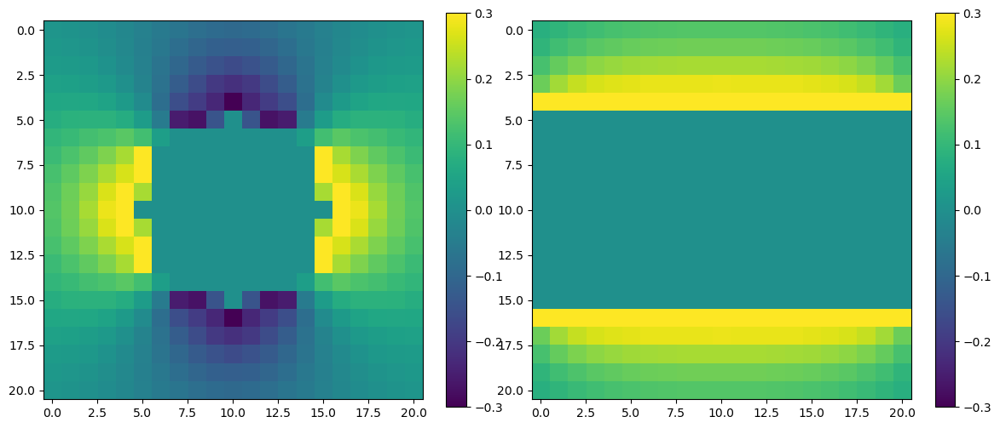

In [17]:
fm_simu_NC = simuMoi['I_sus']
mask_simu = -(maskMoi['I']-1)

fm_simu = fm_simu_NC*mask_simu #put the vertebrae to zero

#######################################################################################################""
fm_simu_final = fm_simu[139:160,139:160,139:160].real
mask_simu_final = mask_simu[139:160,139:160,139:160].real
#######################################################################################################""

print(np.shape(fm_simu_final))

plt.figure(figsize=(12,10))
plt.subplot(2,2,1)
plt.imshow(fm_simu_final[:,:,dz],vmin=-0.3, vmax=0.3)
plt.colorbar()

plt.subplot(2,2,2)
plt.imshow(fm_simu_final[dy,:,:],vmin=-0.3, vmax=0.3)
plt.tight_layout()
plt.colorbar()



We want water < bone  <p>
but we have vertebrae < water <p>
so we need to lower the water  <p>
so we need that sugar+water < water  <p>
but we simulate inside=1 so we simulated sugar> water  <p>
--> we need to have inverted signs between simu and expe  <p>
--> that is the case so sugar is a way to lower the susceptibility of water :)

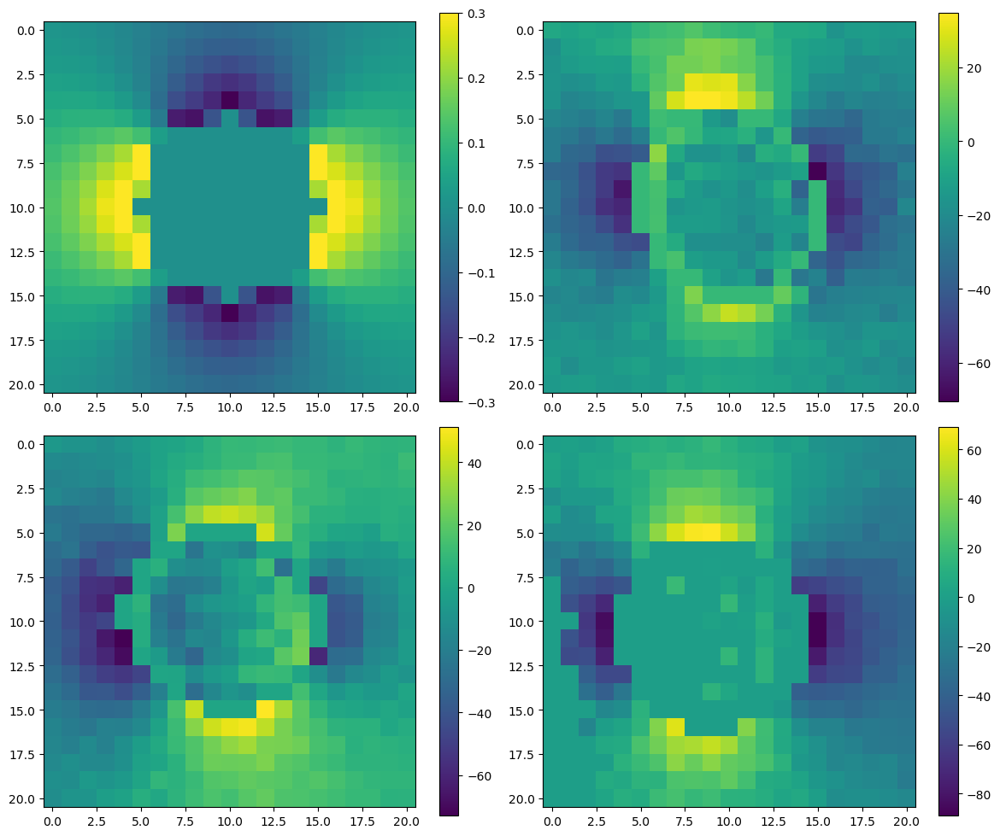

In [18]:
plt.figure(figsize=(12,10))
plt.subplot(2,2,1)
plt.imshow(fm_simu_final[:,:,dz],vmin=-0.3, vmax=0.3)
plt.colorbar()

plt.subplot(2,2,2)
plt.imshow(fm_sugar_c1[:,:,dz-1])
plt.tight_layout()
plt.colorbar()

plt.subplot(2,2,3)
plt.imshow(fm_sugar_c2[:,:,dz])
plt.tight_layout()
plt.colorbar()

plt.subplot(2,2,4)
plt.imshow(fm_sugar_c3[:,:,dz])
plt.tight_layout()
plt.colorbar()

### Linear regression

In [19]:
def linear_reg_simexp(fm_simu1, fm_exp1, mask_simu1, mask_exp1, part, xmin=0, ymin=0, zmin=0, xmax=np.shape(fm_simu)[1], ymax=np.shape(fm_simu)[0], zmax=np.shape(fm_simu)[2]):
    '''
    Calculate the linear regression between `fm_simu1` and `fm_exp1`, excluding the values inside the masks (inside the compound).

    
    The regression between fm_simu1 and fm_exp1 is calculated on the voxels which coordinates are inside [xmin,xmax],[ymin,ymax],[zmin,zmax]
    Attention: x is the second component and y the first one.
    Plot the linear regression, one slice of the simulated and acquired field map and the histogram of the error. 
    
    Parameters
    ----------
    fm_simu1 : np.ndarray
        3D array of the simulated FM.
    fm_exp1 : np.ndarray
        3D array of the acquired FM.
    mask_simu1 : np.ndarray
        3D array of the simulated mask.
    mask_exp1 : np.ndarray
        3D array of the acquired mask.
    part : str
        description of the compound.
    xmin : int, optional
        the minimum x value to use for the regression calculation. The default is 0.
    ymin : int, optional
        the minimum y value to use for the regression calculation. The default is 0.
    zmin : int, optional
        the minimum z value to use for the regression calculation. The default is 0.
    xmax : int, optional
        the maximum x value to use for the regression calculation. The default is np.shape(fm_simu)[1].
    ymax : int, optional
        the maximum y value to use for the regression calculation. The default is nnp.shape(fm_simu)[0].
    zmax : int, optional
        the maximum z value to use for the regression calculation. The default is np.shape(fm_simu)[2].

    Returns
    -------
    result_corrected : scipy.stats._stats_mstats_common.LinregressResult
        A tuple containing the parameters of the regression line.

    '''
    ### reshaping to 1D vector
    
    fm_simu=fm_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
    fm_exp=fm_exp1[ymin:ymax, xmin:xmax, zmin:zmax]
    mask_simu2=mask_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
    mask_exp2=mask_exp1[ymin:ymax, xmin:xmax, zmin:zmax]

    m,n,p = fm_simu.shape
    simu = fm_simu.reshape(m*n*p) #need to have vector 1D to apply the linear regression
    exp = fm_exp.reshape(n*m*p)

    mask_exp = mask_exp2.reshape(m*n*p)
    mask_simu = mask_simu2.reshape(m*n*p)

    exp_corrected = []
    simu_corrected=[]

    for i in range(m*p*n):
        if mask_exp[i]!=0 and mask_simu[i]!=0:
            simu_corrected.append(simu[i])
            exp_corrected.append(exp[i])

    ### regression lineaire
    result_corrected = scipy.stats.linregress(simu_corrected, exp_corrected)
    print(f'######## regression linéaire - {part} ############')
    print(f' fm_exp = {result_corrected.slope} * fm_simu + {result_corrected.intercept} ')
    print(f'R^2 = {result_corrected.rvalue **2}')
    print(f'p-value = {result_corrected.pvalue }')


    #######################"" plot################################
    plt.figure(figsize=(9,7))
    plt.subplot(221)
    plt.plot(simu_corrected, exp_corrected, '.', c='pink', label=part)
    plt.xlabel('Simulated data (ppm)', size=12)
    plt.ylabel('Measured data (Hz)', size=12)
#     plt.title(f'Correlation acquisition/simulation')
    plt.plot(simu, result_corrected.intercept + result_corrected.slope*simu, 'black')
#     plt.legend()
    
    plt.subplot(223) ## histogram of the error
    approx = np.array([result_corrected.intercept + result_corrected.slope*simu_corrected[i] for i in range(len(simu_corrected))])
    error = exp_corrected - approx #f(xi)-y
    plt.hist(error, bins=75)
    plt.xlabel('$ f(x_i)-y$', size=13)
    plt.ylabel('Number of voxels', size=13)

#     plt.title('Histogram of the error f(xi)-y')
    
    plt.subplot(222)
    plt.imshow(fm_simu[:,:, int((zmax-zmin)/2)])
#     plt.title('Simulation (ppm)', size=12)
    plt.colorbar()
    plt.axis('off')

    plt.subplot(224)
    plt.imshow(fm_exp[:,:, int((zmax-zmin)/2)])    
    plt.colorbar()
#     plt.title(f'Measurement (Hz)', size=12)
    plt.axis('off')

    plt.tight_layout()
    
    plt.text(x= -38.45 ,y=-26.4, s='a)', size=15)
    plt.text(x= -0.8 ,y=-26.4, s='b)', size=15)
    plt.text(x= -38.45 ,y=-1, s='c)', size=15)
    plt.text(x= -0.8,y=-1, s='d)', size=15)
    plt.text(x= -19,y=-20, s='$y = -115.6 \cdot x-8.88$', size=12)
#     tikzplotlib.save(r"figures\correlation_simu_exp_sugarC1.tex")
#     plt.savefig(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\tests materiaux\230224_test5_sugar_mouthwash\figures\linearregression_sugar_c1.png", dpi=300)

    plt.show()

    

    
    print(np.shape(fm_simu))
    return result_corrected

(21, 21, 21)
(21, 21, 21)
######## regression linéaire - slice sugar C1 ############
 fm_exp = -115.62574866864078 * fm_simu + -8.875595316456467 
R^2 = 0.7889155669112302
p-value = 1.4208947864915963e-118


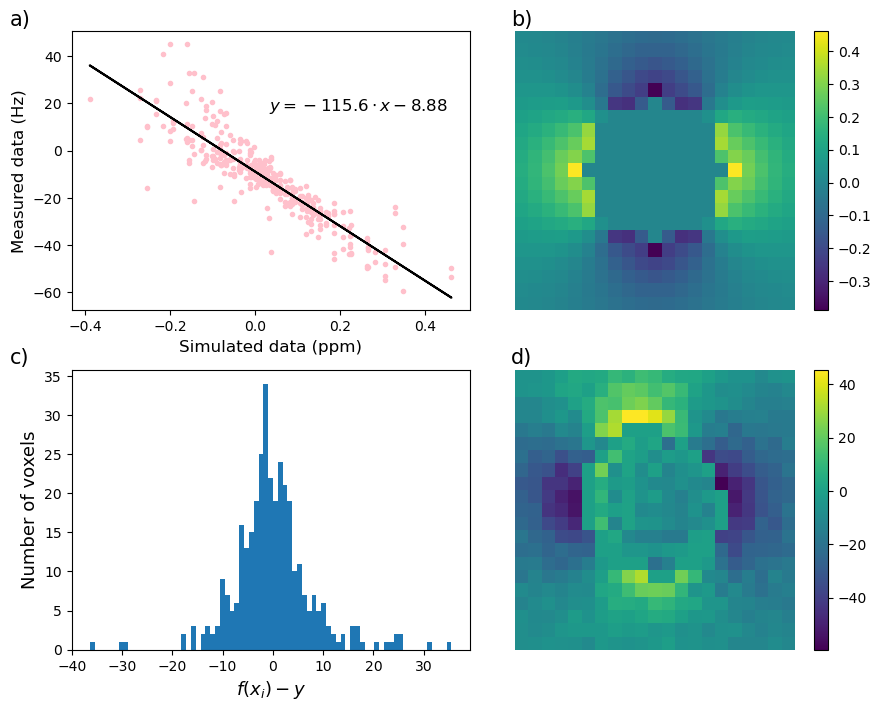

(21, 21, 1)


In [20]:
print(np.shape(fm_sugar_c1))
print(np.shape(fm_simu_final))

result_sugar_c1_slice = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_sugar_c1, mask_simu1=mask_simu_final, mask_exp1=mask_sugar_c1, part="slice sugar C1", zmin=dz, zmax=dz+1)


######## regression linéaire - slice sugar C2 ############
 fm_exp = -143.34962667129125 * fm_simu + -1.4299915040569076 
R^2 = 0.6932862053423368
p-value = 1.4900587432466286e-90


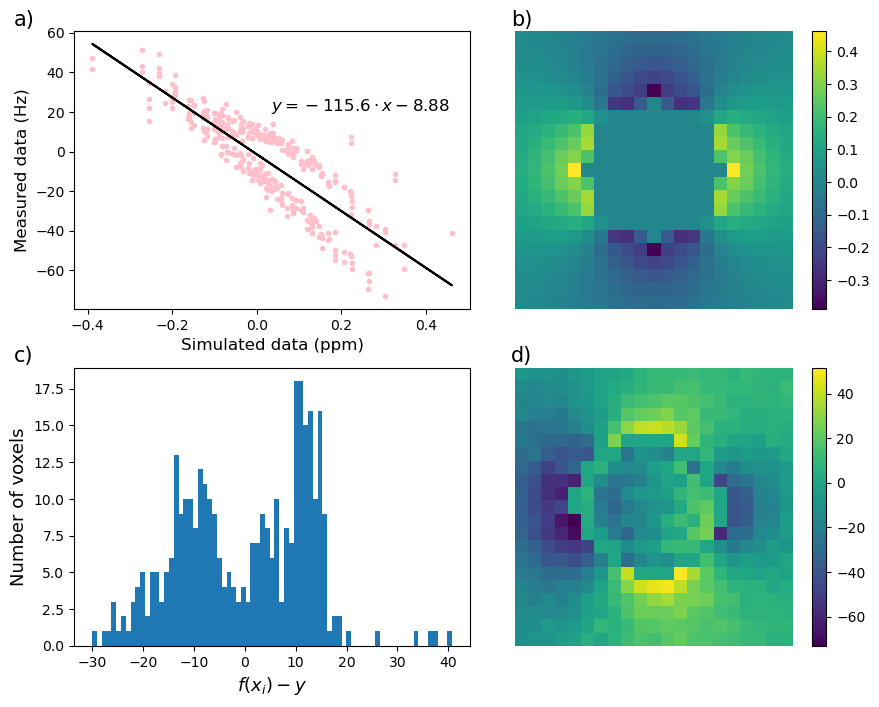

(21, 21, 1)


In [21]:
result_sugar_c2_slice = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_sugar_c2, mask_simu1=mask_simu_final, mask_exp1=mask_sugar_c2, part="slice sugar C2", zmin=dz, zmax=dz+1)


######## regression linéaire - slice sugar C3 ############
 fm_exp = -198.05213777344014 * fm_simu + -5.860099600618922 
R^2 = 0.7968871771556207
p-value = 6.1870094093963024e-108


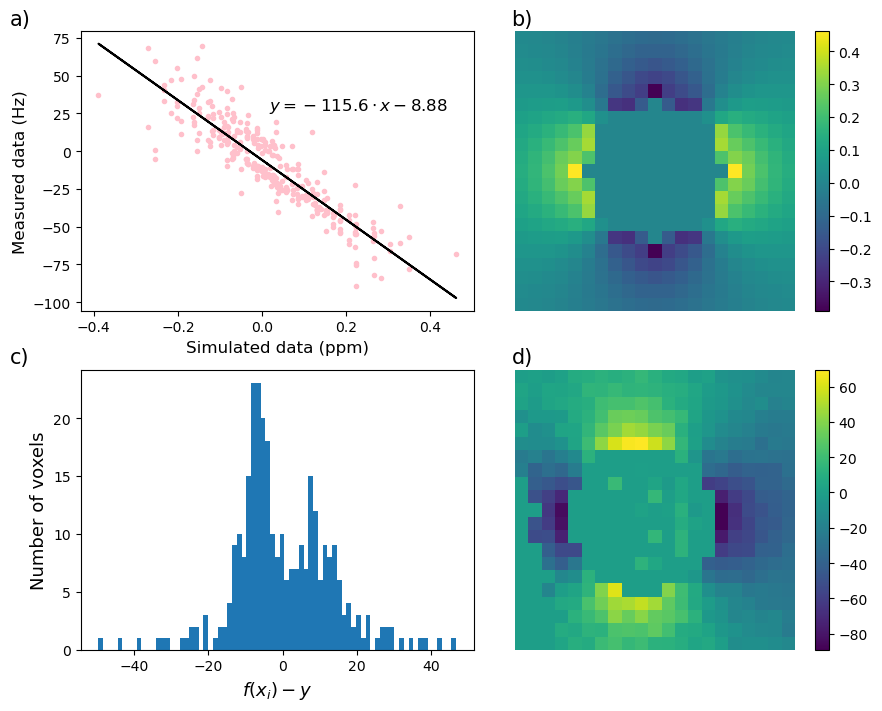

(21, 21, 1)


In [22]:
result_sugar_c3_slice = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_sugar_c3, mask_simu1=mask_simu_final, mask_exp1=mask_sugar_c3, part="slice sugar C3", zmin=dz, zmax=dz+1)


######## regression linéaire - slice melange ############
 fm_exp = -200.63539491111197 * fm_simu + -0.35973235662510294 
R^2 = 0.8437761689854913
p-value = 9.874890499630896e-141


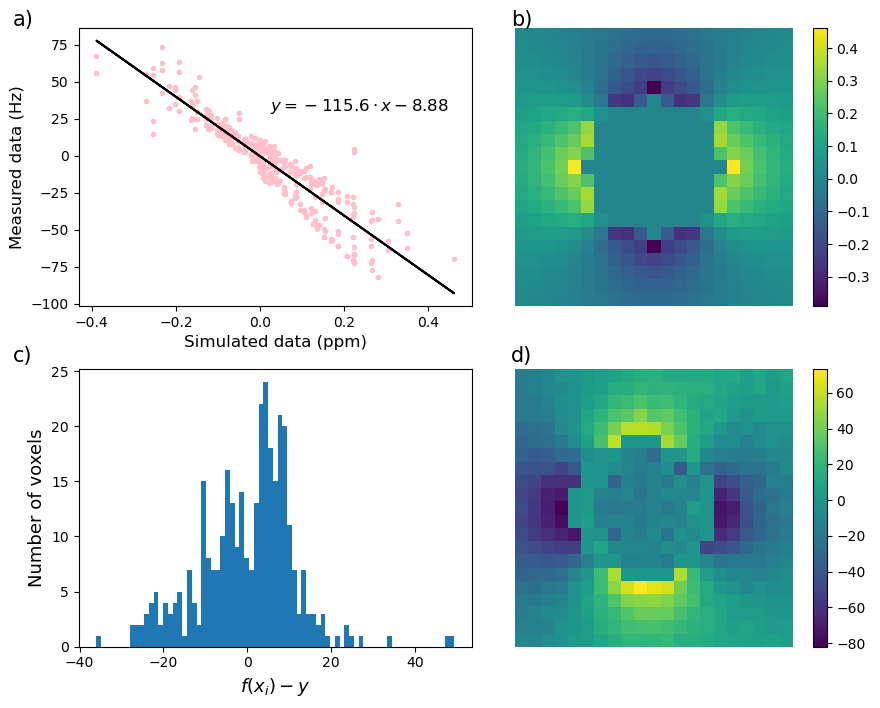

(21, 21, 1)


In [23]:
result_melange = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_melange, mask_simu1=mask_simu_final, mask_exp1=mask_melange, part="slice melange", zmin=dz, zmax=dz+1)


######## regression linéaire - slice mouthwash1 ############
 fm_exp = -27.443405983681014 * fm_simu + 1.9720844724787168 
R^2 = 0.3786680004309029
p-value = 7.551335434642124e-38


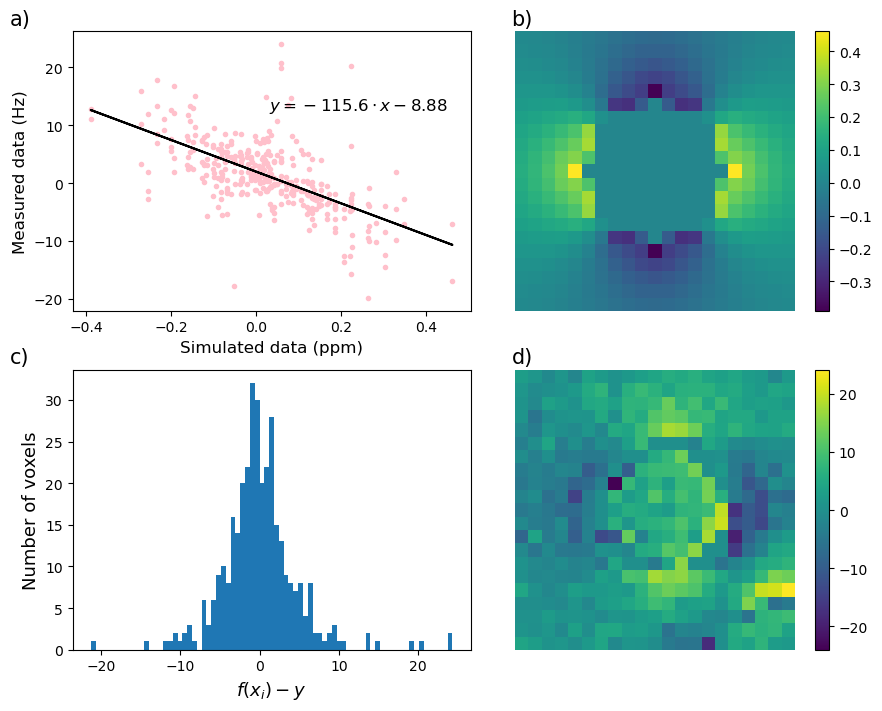

(21, 21, 1)


In [24]:
result_mouthwash1 = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_mouthwash1, mask_simu1=mask_simu_final, mask_exp1=mask_mouthwash1, part="slice mouthwash1", zmin=dz, zmax=dz+1)


######## regression linéaire - slice mouthwash2 ############
 fm_exp = -45.64242387511032 * fm_simu + 2.5243132543316653 
R^2 = 0.5438113168548022
p-value = 6.632305960624639e-60


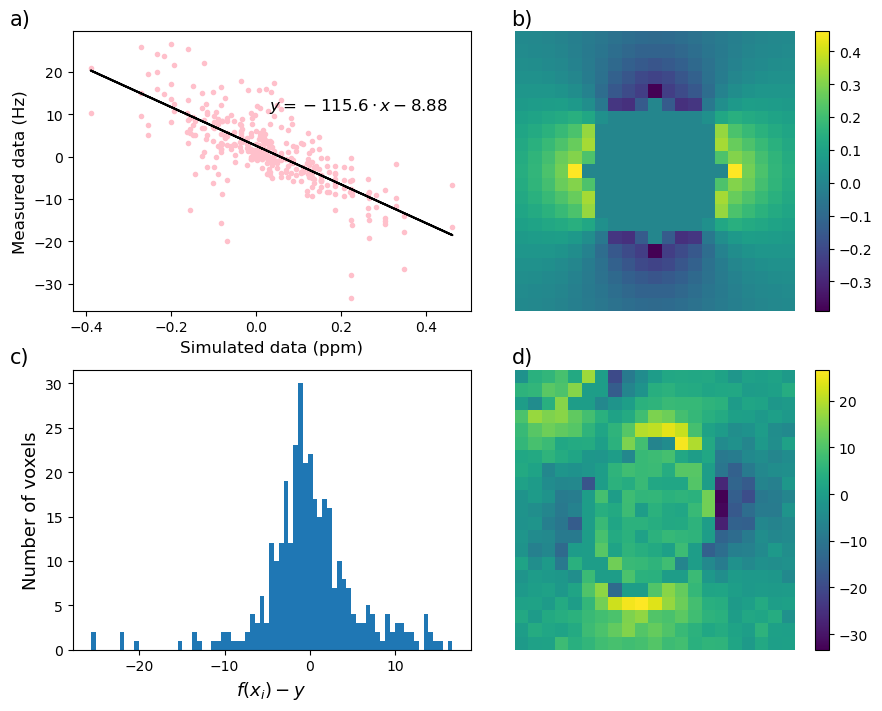

(21, 21, 1)


In [25]:
result_mouthwash2 = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_mouthwash2, mask_simu1=mask_simu_final, mask_exp1=mask_mouthwash2, part="slice mouthwash2", zmin=dz, zmax=dz+1)


######## regression linéaire - slice soap ############
 fm_exp = -54.95168961941808 * fm_simu + -2.835050916861091 
R^2 = 0.6878993461705213
p-value = 3.112806480831758e-88


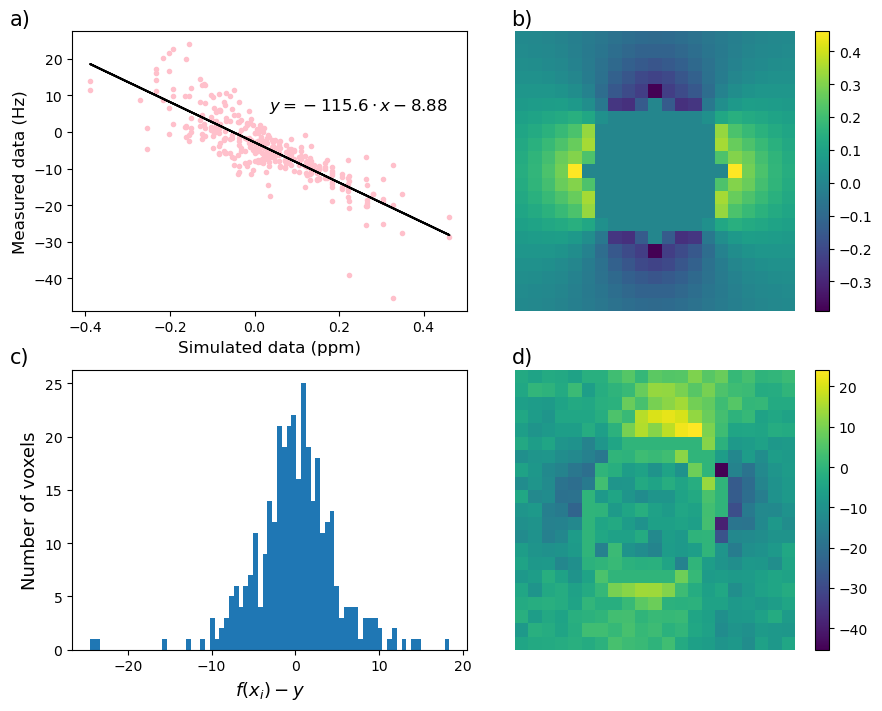

(21, 21, 1)


In [26]:
result_soap = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_soap, mask_simu1=mask_simu_final, mask_exp1=mask_soap, part="slice soap", zmin=dz, zmax=dz+1)


######## regression linéaire - slice empty ############
 fm_exp = -18.47534942995406 * fm_simu + -4.501050705267332 
R^2 = 0.08376861154557962
p-value = 5.0383772770351944e-08


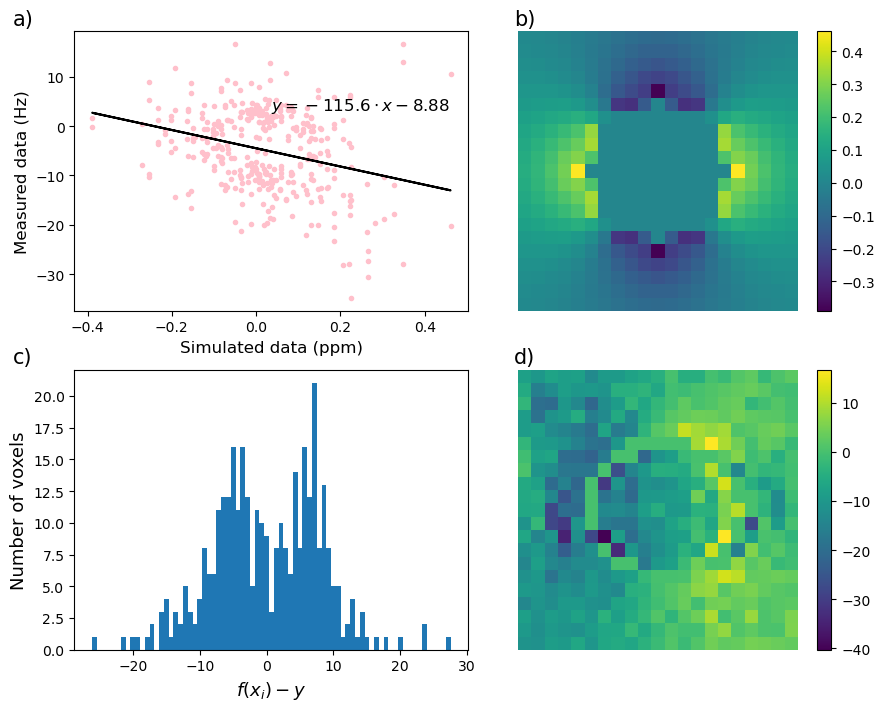

(21, 21, 1)


In [27]:
result_empty = linear_reg_simexp(fm_simu1=fm_simu_final, fm_exp1=fm_empty, mask_simu1=mask_simu_final, mask_exp1=mask_empty, part="slice empty", zmin=dz, zmax=dz+1)


# II. Multiecho GRE

## A. Sugar

In [28]:
path_12TE_sugar = [f"JOHANNA_BRUNNHILDE_20230224\GRE_0_3MM_12TE_SUGAR_0017\GRE_0_3MM_12TE_SUGAR_0017_GRE_0.3mm_12TE_sugar_20230224095347_17_e{i}.nii" for i in range(1,13) ]

(576, 600, 25)


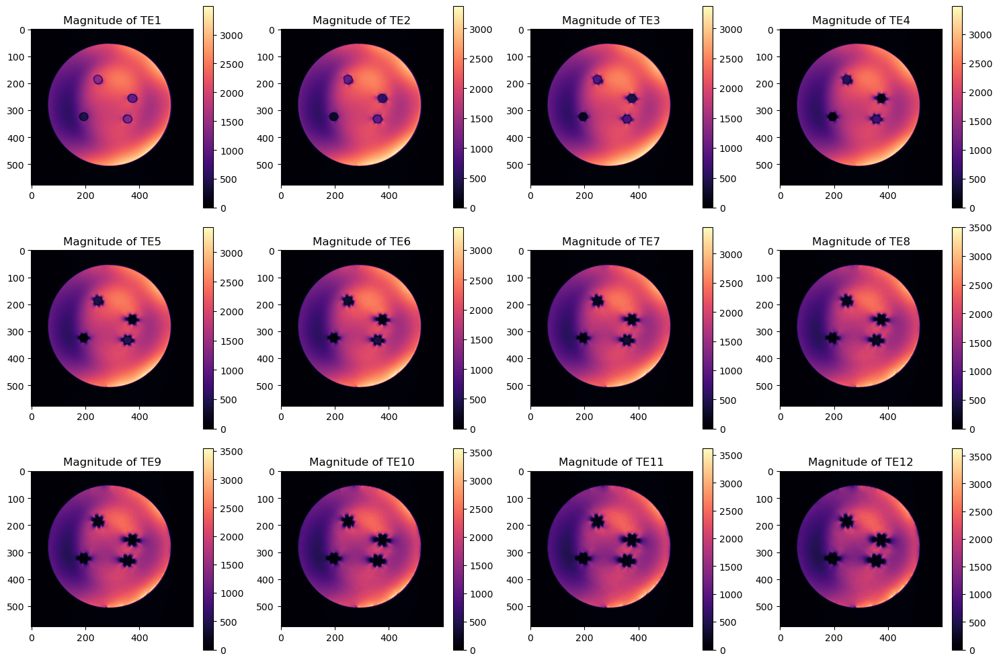

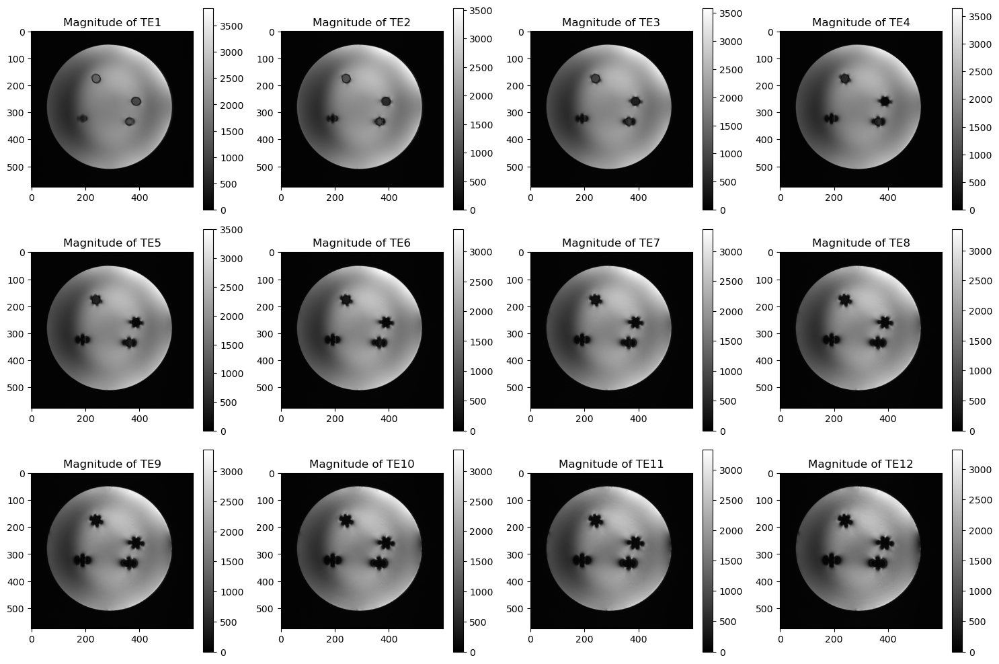

In [29]:
mag_12TE_sugar = [nib.load(path_12TE_sugar[i]).get_fdata() for i in range(12)]

plt.figure('12TE Sugar', figsize=(15,10))

for i in range(len(mag_12TE_sugar)):
    plt.subplot(3,4,i+1)
    plt.imshow(mag_12TE_sugar[i][:,:,6] , cmap='magma')
    plt.colorbar()
    plt.title(f'Magnitude of TE{i+1}')

plt.tight_layout()

print(np.shape(mag_12TE_sugar[0]))
plt.show()

plt.figure('12TE', figsize=(15,10))

for i in range(len(mag_12TE_sugar)):
    plt.subplot(3,4,i+1)
    plt.imshow(mag_12TE_sugar[i][:,:,9] , cmap='gray')
    plt.colorbar()
    plt.title(f'Magnitude of TE{i+1}')

plt.tight_layout()


In [30]:
###### Cooridnates of the center of each sample in multiecho"#######"
### Mouthwaash 1 2 soap and empty ###
# x_mouthwash1, y_mouthwash1, z_mouthwash1 = 103, 67, 75
# x_mouthwash2, y_mouthwash2, z_mouthwash2 = 112, 79, 75
# x_soap, y_soap, z_soap = 67, 62, 75
# x_empty, y_empty, z_empty = 75, 98, 75

### Sugar ###
x_sugar_c1_multi, y_sugar_c1_multi, z_sugar_c1_multi = 242, 179, 7
x_sugar_c2_multi, y_sugar_c2_multi, z_sugar_c2_multi = 379, 254, 7
x_sugar_c3_multi, y_sugar_c3_multi, z_sugar_c3_multi = 190, 323, 7
x_melange_multi, y_melange_multi, z_melange_multi = 360, 331, 7


dx_multi, dy_multi, dz_multi = 10, 10, 3
###########################################################""

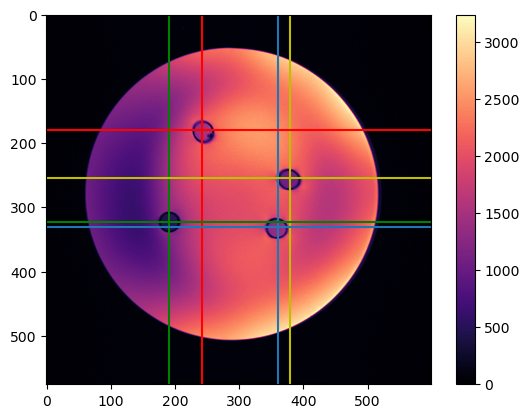

In [31]:
plt.figure()
plt.imshow(mag_12TE_sugar[0][:,:, z_sugar_c1_multi] , cmap='magma')
plt.colorbar()

plt.axvline(x=x_sugar_c1_multi, c='r')
plt.axvline(x=x_sugar_c2_multi, c='y')
plt.axvline(x=x_sugar_c3_multi, c='g')
plt.axvline(x=x_melange_multi)

plt.axhline(y=y_sugar_c1_multi, c='r')
plt.axhline(y=y_sugar_c2_multi, c='y')
plt.axhline(y=y_sugar_c3_multi, c='g')
plt.axhline(y=y_melange_multi)





# plt.axvline(x=x_mouthwash1_multi, c='r')
# plt.axvline(x=x_mouthwash2_multi, c='y')
# plt.axvline(x=x_soap_multi, c='g')
# plt.axvline(x=x_empty_multi)

# plt.axhline(y=y_mouthwash_multi1, c='r')
# plt.axhline(y=y_mouthwash2_multi, c='y')
# plt.axhline(y=y_soap_multi, c='g')
# plt.axhline(y=y_empty_multi)
# plt.colorbar()

In [32]:
def multiTE_plot(x, mag_multiTE = mag_12TE_sugar, x_center=x_sugar_c3_multi, y_center=y_sugar_c3_multi, z_center=z_sugar_c3_multi, dx_multi=30, dy_multi=30, dz_multi=30, color='gray'):
    """
    Plot one reshaped transversal slice of a tube for the 12 different TE and their difference from the first image.

    Parameters
    ----------
    x : int
        x-coordinate of the slices to display
    mag_multiTE : list, optimal
        list of magnitude 3D arrays for each TE time. The default is mag_12TE_sugar.
    x_center : int, optimal
        x coordinate of the center of the tube of the solution. The default is x_sugar_c3_multi.
    y_center : int, optimal
        y coordinate of the center of the tube of the solution. The default is y_sugar_c3_multi.
    z_center : int, optimal
        z coordinate of the center of the tube of the solution. The default is z_sugar_c3_multi. 
    dx_multi : int, optimal
        0.5*width of the reshaped image on the x direction. The default is 30.
    dy_multi : int, optimal
        0.5*width of the reshaped image on the y direction. The default is 30.
    dz_multi : int, optimal
        0.5*width of the reshaped image on the z direction. The default is 30.
    color : bool, optimal
        colormap to use for the images. The default is 'gray'.

    Returns
    -------
    None
        
    """
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 9))
    c=0
    for ax in axes.flat:
        mag_rescaled = rescaling_FOV(mag_multiTE[c], x=x_center, y=y_center, z=z_center, dx=dx_multi, dy=dy_multi, dz=dz_multi)      
        im = ax.imshow(mag_rescaled[:,:,x], cmap=color,vmin=-10, vmax= 1500)
        ax.axis('off')
        c+=1
    fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

    # add an axes, lower left corner in [0.83, 0.1] measured in figure coordinate with axes width 0.02 and height 0.8
    cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    cbar = fig.colorbar(im, cax=cb_ax)
    plt.show()
    
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 9))
    c=0
    M1 = rescaling_FOV(mag_multiTE[0], x=x_center, y=y_center, z=z_center, dx=dx_multi, dy=dy_multi, dz=dz_multi)      

    for ax in axes.flat:
        mag_rescaled = rescaling_FOV(mag_multiTE[c],x=x_center, y=y_center, z=z_center, dx=dx_multi, dy=dy_multi, dz=dz_multi)      
        im = ax.imshow((M1[:,:,x]-mag_rescaled[:,:,x]), vmin=-0, vmax=1400)
        ax.axis('off')
        c+=1
    fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

    # add an axes, lower left corner in [0.83, 0.1] measured in figure coordinate with axes width 0.02 and height 0.8
    cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    cbar = fig.colorbar(im, cax=cb_ax)

    plt.show()

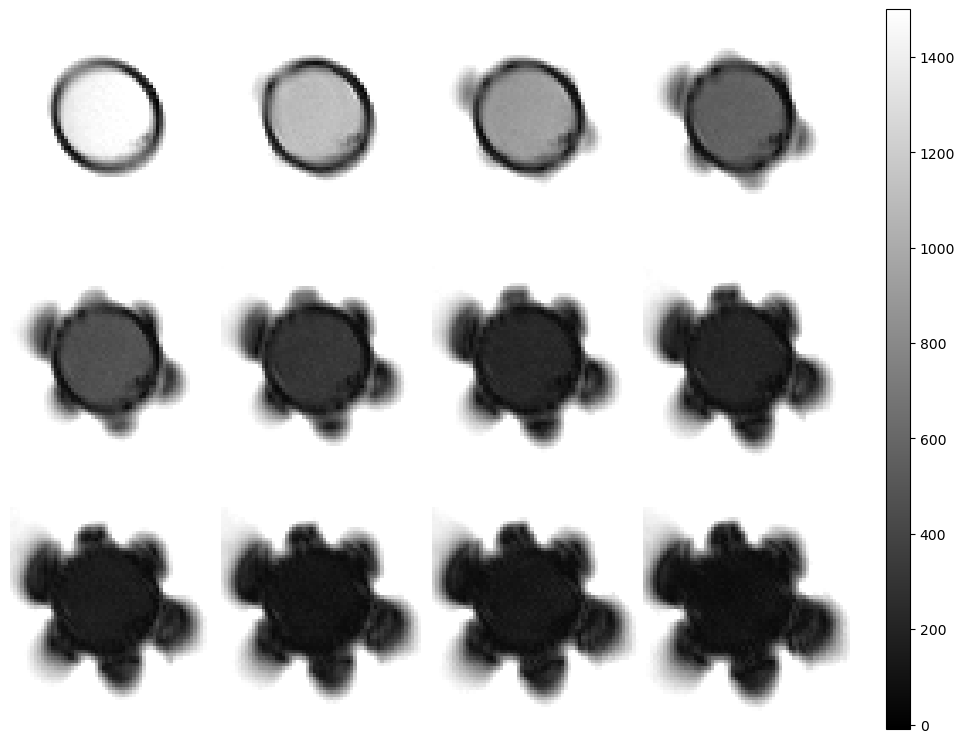

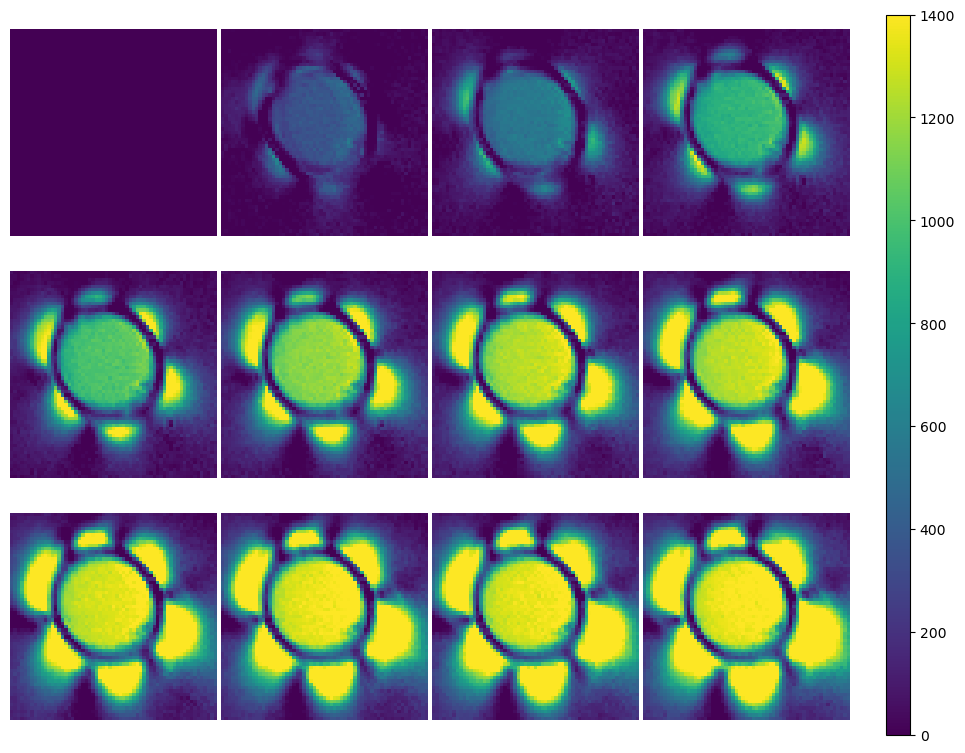

In [33]:
# Sugar C1
multiTE_plot(7, mag_multiTE = mag_12TE_sugar, x_center=x_sugar_c1_multi, y_center=y_sugar_c1_multi, z_center=z_sugar_c1_multi, dx_multi=30, dy_multi=30, dz_multi=(5), color='gray')

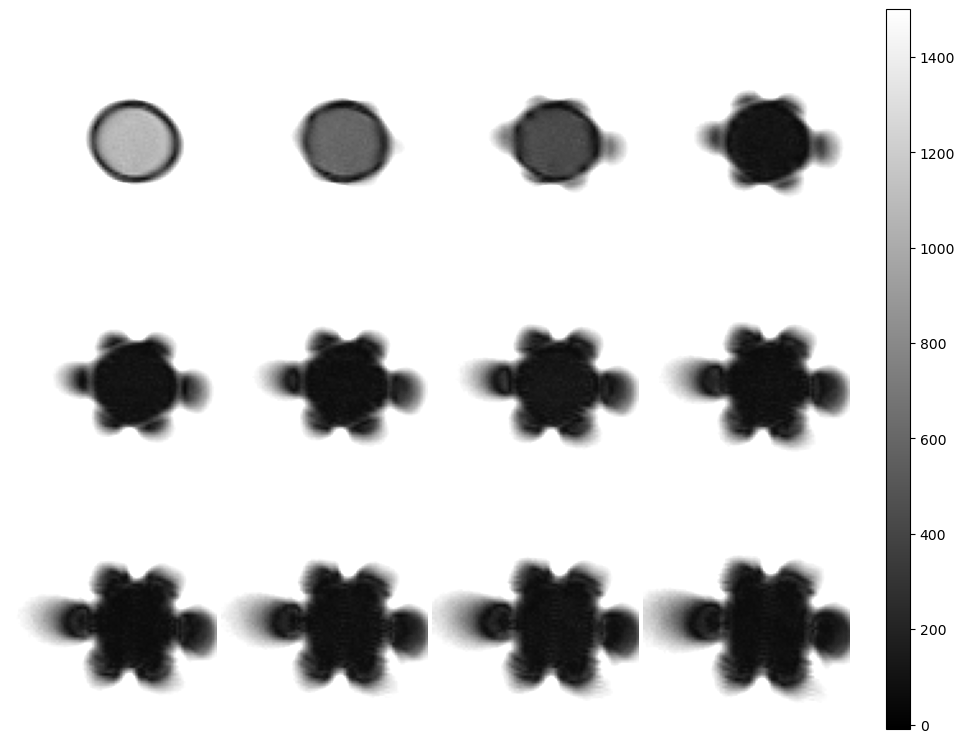

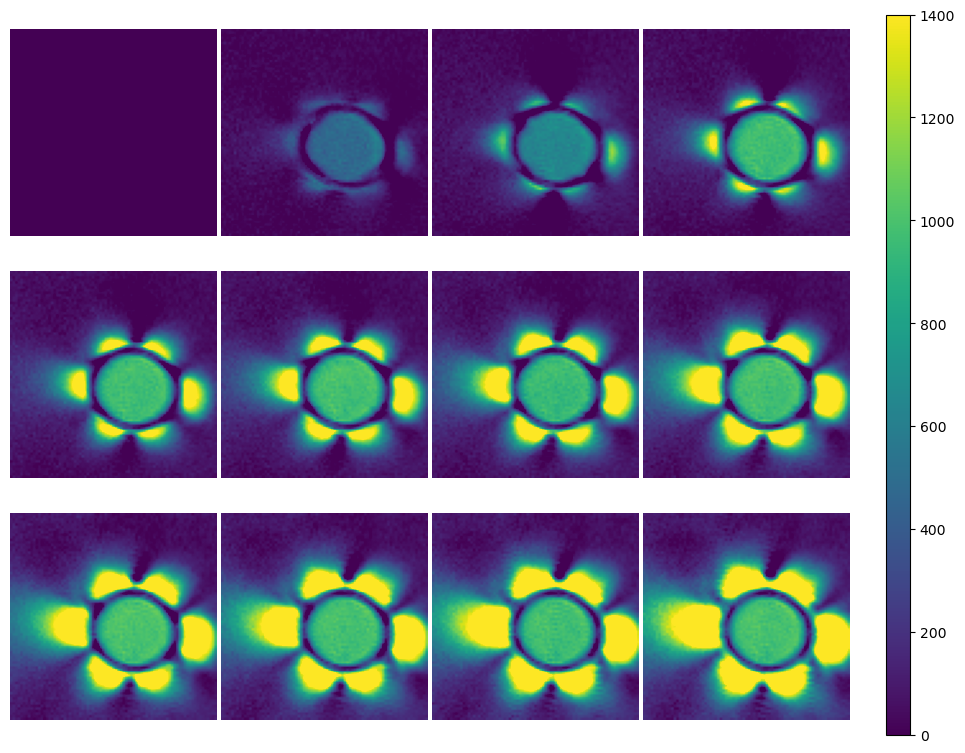

In [34]:
# Sugar C2
multiTE_plot(7, mag_multiTE = mag_12TE_sugar, x_center=x_sugar_c2_multi, y_center=y_sugar_c2_multi, z_center=z_sugar_c2_multi, dx_multi=40, dy_multi=40, dz_multi=(5), color='gray')

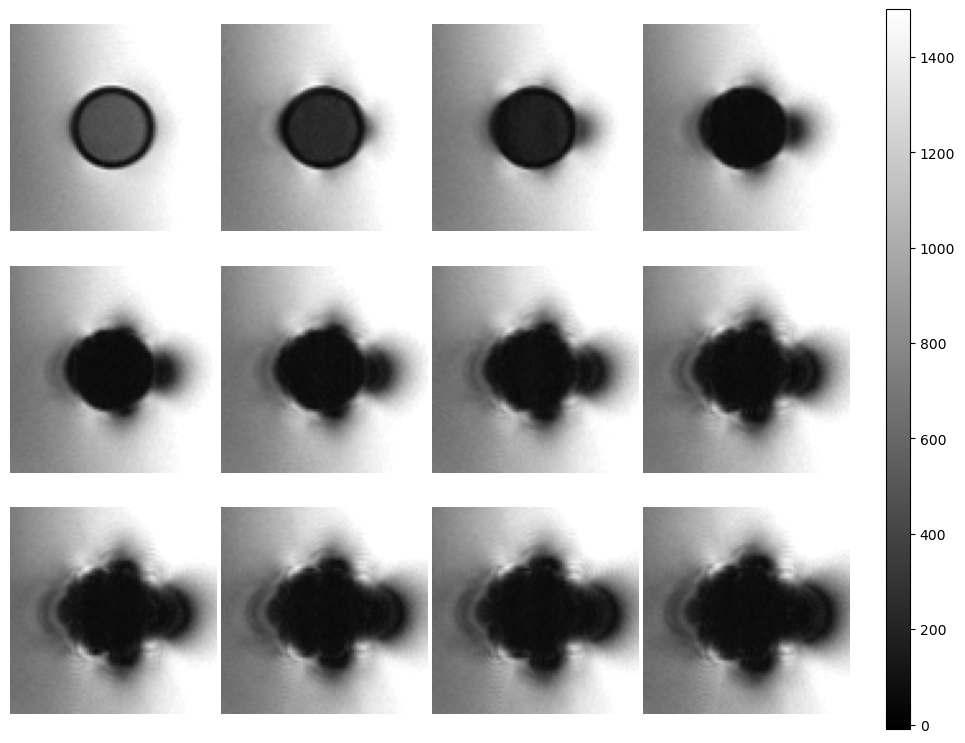

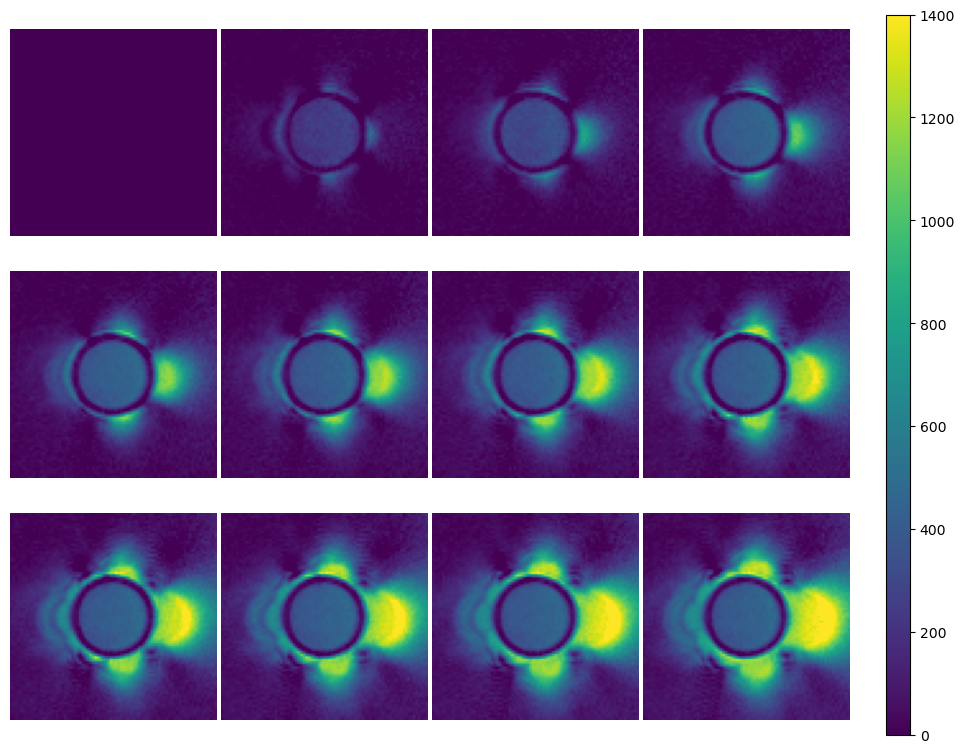

In [35]:
# Sugar C3
multiTE_plot(6, mag_multiTE = mag_12TE_sugar, x_center=x_sugar_c3_multi, y_center=y_sugar_c3_multi, z_center=z_sugar_c3_multi, dx_multi=40, dy_multi=40, dz_multi=(5), color='gray')

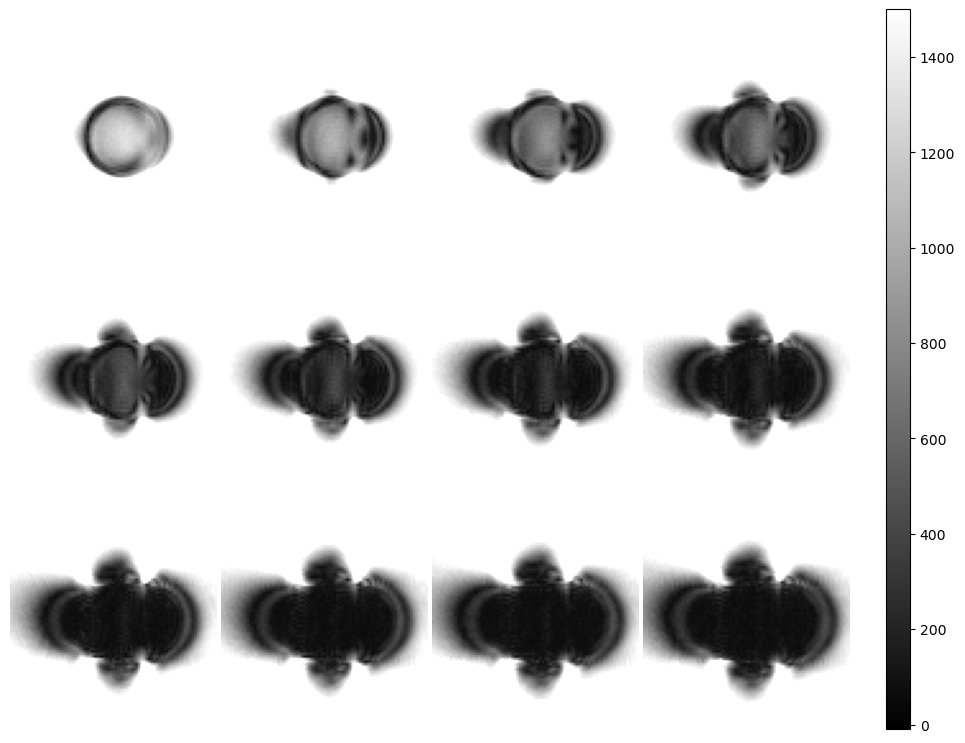

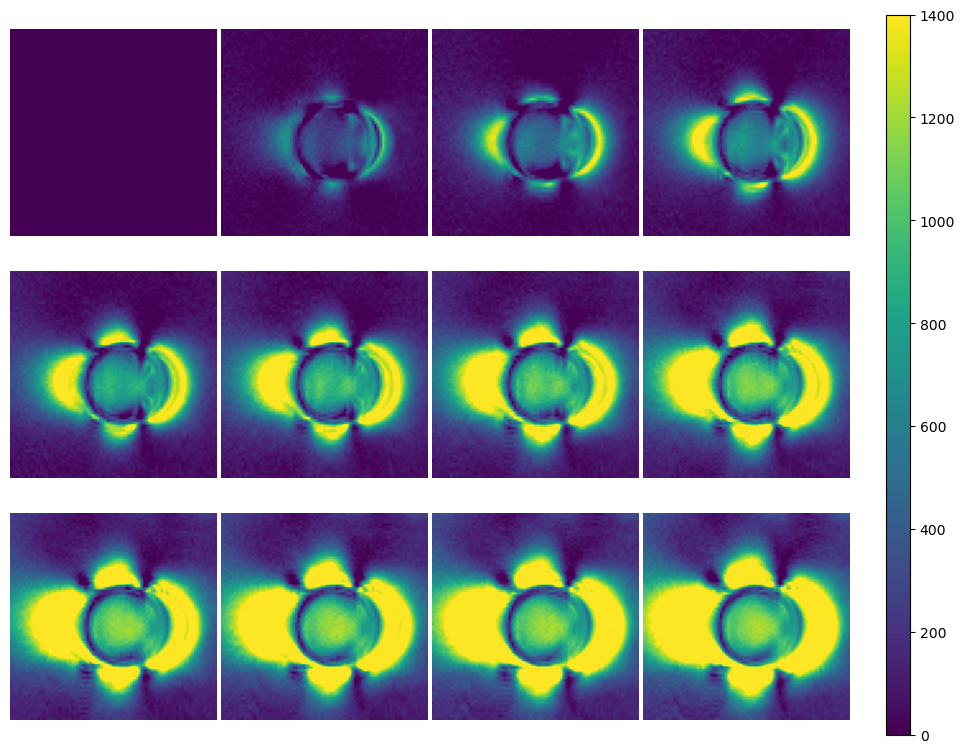

In [36]:
# Sugar melange
multiTE_plot(7, mag_multiTE = mag_12TE_sugar, x_center=x_melange_multi, y_center=y_melange_multi, z_center=z_melange_multi, dx_multi=40, dy_multi=40, dz_multi=(5), color='gray')

### T2 map


In [37]:
def T2_star_value(x,y,z):
    '''
    Compute the $T_2^*$ and associated $R^2$ value of mag_12TE_sugar in one voxel

    Parameters
    ----------
    y : int
        y coordinate of the voxel.
    x : int
        x coordinate of the voxel. 
    z : int
        z coordinate of the voxel. 
   
    Returns
    -------
    (T2_star, rSquared) : tulle of int
        tulle of the $T_2^*$ and associated $R^2$ of the selected voxel.

    '''
    m,n,p = np.shape(mag_12TE_sugar[0])
    print(m,n,p)
    TE = np.array([7.40, 14, 20.28, 27.20, 33.80, 40.4, 47, 53.6, 60.2, 66.8, 73.4, 80]) #ms

    y, x, z = y, x, z

    echo = np.array([mag_12TE_sugar[i][y][x][int(z)] for i in range(12)])  #we first try t find the T2 value on one voxel

    plt.figure(figsize=(10,4))
    plt.subplot(122)
#     plt.figure()
    plt.imshow(mag_12TE_sugar[0][:,:,int(z)])
    plt.axvline(x=x, color='b' )
    plt.axhline(y=y, color='b')
#     plt.colorbar()
    plt.axis('off')
    
#     tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\T2_star_sugar\T2_star_sugar_1.tex")

    plt.subplot(121)
#     plt.figure()
    plt.plot(TE, echo, "+")


    def monoExp(t, A, T2_star, b):
        return A * np.exp(-t / T2_star) +b

    # perform the fit
    # p0 = (1, 1) # start with values near those we expect
    params, cv = scipy.optimize.curve_fit(monoExp, TE, echo, bounds=(0, [5000, 2000, 500]), maxfev=5000)
    A, T2_star, b = params

    print(params)
    # determine quality of the fit
    squaredDiffs = np.square(echo - monoExp(TE, A, T2_star, b))
    squaredDiffsFromMean = np.square(echo - np.mean(echo))
    rSquared = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)
    print(f"R² = {rSquared}")

    # plot the results
    plt.plot(TE, echo, "+", label="data", c='black')
    plt.plot(TE, monoExp(TE, A, T2_star, b), '--', label="fitted", c="red")
#     plt.title("Fitted Exponential Curve")
    plt.xlabel('TE (ms)', size=12)
    plt.ylabel('Magnitude', size=12)
    # inspect the parameters
    print(f"echo = {A} * e^(-t/{T2_star}) +{b}")
    plt.tight_layout()
    plt.text(x= -8 ,y=1620, s='a)', size=15)
    plt.text(x= 93 ,y=1620, s='b)', size=15)
#     tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\T2_star_sugar\T2_star_sugar_2.tex")

#     plt.text(x= 30 ,y=1000, s='$y = 2105 \cdot e^{-t/20.5}+41.9$', size=9)

#     plt.savefig(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\tests materiaux\230224_test5_sugar_mouthwash\figures\T2_star_regression_sugar_C1")


576 600 25
[2104.80336755   20.49966656   41.86230144]
R² = 0.9909099482191122
echo = 2104.803367546341 * e^(-t/20.499666558563074) +41.8623014392275


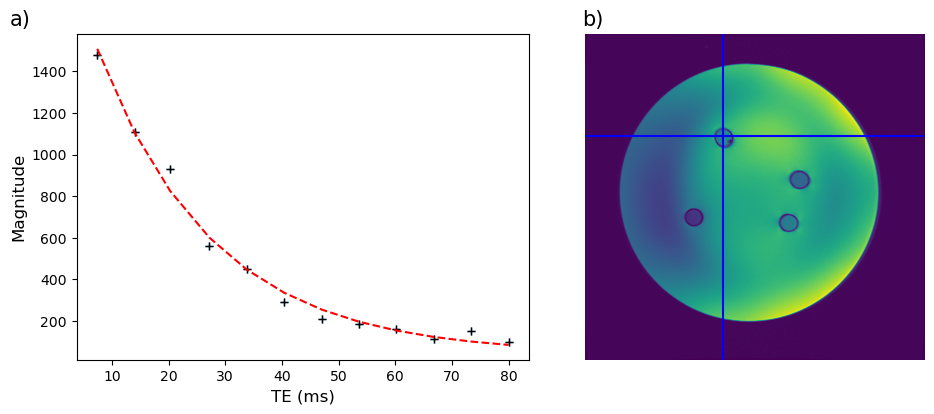

In [38]:
T2_star_value(x_sugar_c1_multi+2, y_sugar_c1_multi+1, z_sugar_c1_multi)

576 600 25
[2261.67802403    9.17455673   77.47193312]
R² = 0.9789783868563587
echo = 2261.678024025588 * e^(-t/9.174556728198262) +77.47193311889265


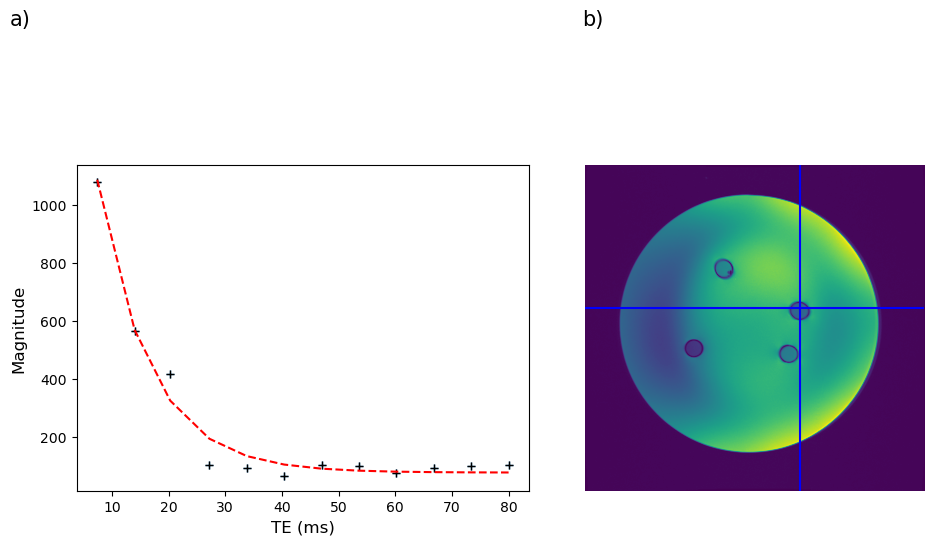

In [39]:
T2_star_value(x_sugar_c2_multi, y_sugar_c2_multi-1, z_sugar_c2_multi)

576 600 25
[1095.24143715    7.84249256   76.12265832]
R² = 0.9785730102093008
echo = 1095.2414371536515 * e^(-t/7.842492563928749) +76.12265831530566


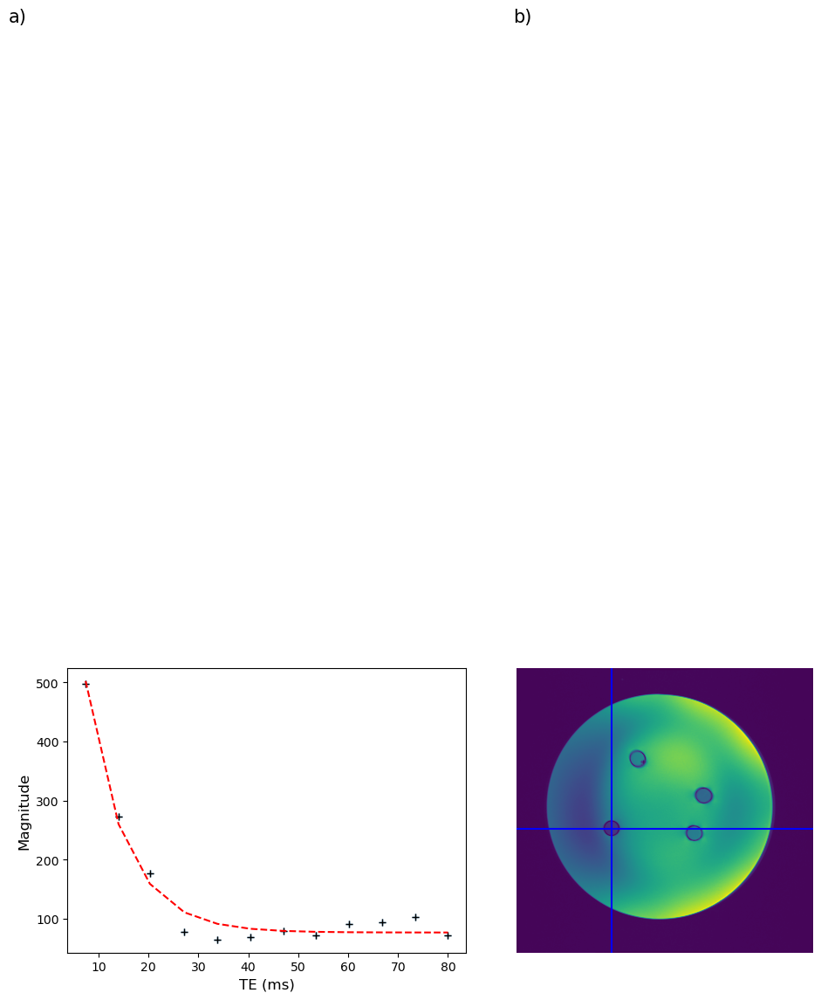

In [40]:
T2_star_value(x_sugar_c3_multi+2, y_sugar_c3_multi+2, z_sugar_c3_multi)

576 600 25
[1791.61566434   27.27535418   10.85369183]
R² = 0.9816272334373368
echo = 1791.6156643447532 * e^(-t/27.275354179700106) +10.853691825904988


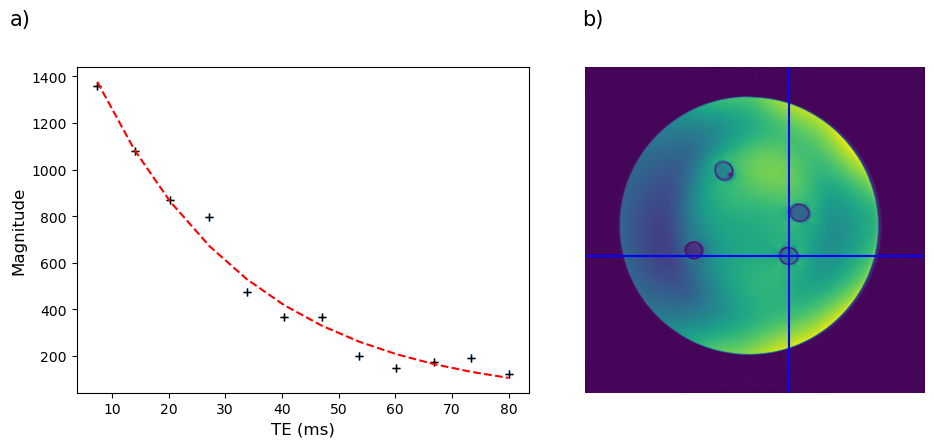

In [41]:
T2_star_value(x_melange_multi, y_melange_multi+3, z_melange_multi)

576 600 25
[2.40919095e+03 5.61290323e+02 3.11760290e-13]
R² = 0.8742738280571434
echo = 2409.1909480405093 * e^(-t/561.2903228455896) +3.1176029005331636e-13


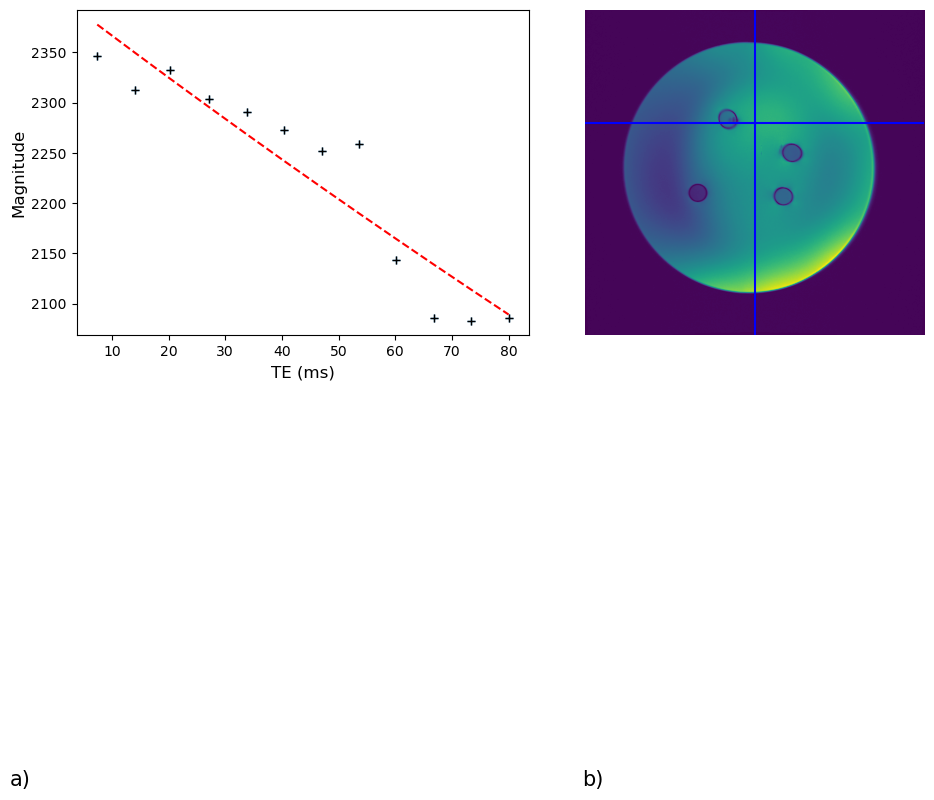

In [42]:
T2_star_value(300, 200, 4)

In [43]:
fig = go.Figure(data=[go.Table(
    header=dict(values=['sugar concentration', 'T2_star', '$R^2$', 'susceptibility impact', '$R^2$'],
                line_color ='darkslategray',
                fill_color='lightskyblue',
                align='left'),
    cells=dict(values=[['water', '350g/L sugar', '550g/L sugar', '750g/L sugar', '750g/L sugar + mouthwash', '530g/L sugar+soap + vertebrae inside', '~6% mouthwash 1', '~6% mouthwash 2', '~50% soap', 'empty/blank'], # 1st column
                       ['~500 to 750ms',20,9.2, 8, 25, 5], 
                      ['variable but ~0.97',  0.98,  0.98,  0.98, 0.98, 'variable but ~0.9-'],
                       [0, -115.6, -143, -198, -200, '', -27, -45.6, -54.9, -18],
                      ['',0.788, 0.69, 0.8, 0.83, '', 0.37, 0.54, 0.69, 0.083]],
               line_color='darkslategray',
               fill_color='lightcyan',
               align='left'))
])

fig.update_layout(width=1000, height=500)
fig.show()

## B. Soap mouthwash and empty

In [44]:
path_12TE_mouthwash_soap_empty = [r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\tests materiaux\230224_test5_sugar_mouthwash\JOHANNA_BRUNNHILDE_20230224\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014\GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e1.nii" for i in range(1,13) ]

In [45]:
path_12TE_mouthwash_soap_empty = [r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e1.nii.gz", r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e2.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e3.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e4.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e5 (1).nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e6.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e7.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e8.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e9.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e10.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e11.nii.gz",r"C:\Users\b\OneDrive\Bureau\test5_masterthesis\GRE_0_3MM_12TE_MOUTHWASH_SOAP_EMPTY_CORONAL_0014_GRE_0.3mm_12TE_Mouthwash_soap_empty_coronal_20230224095347_14_e12.nii.gz"]

(576, 600, 25)


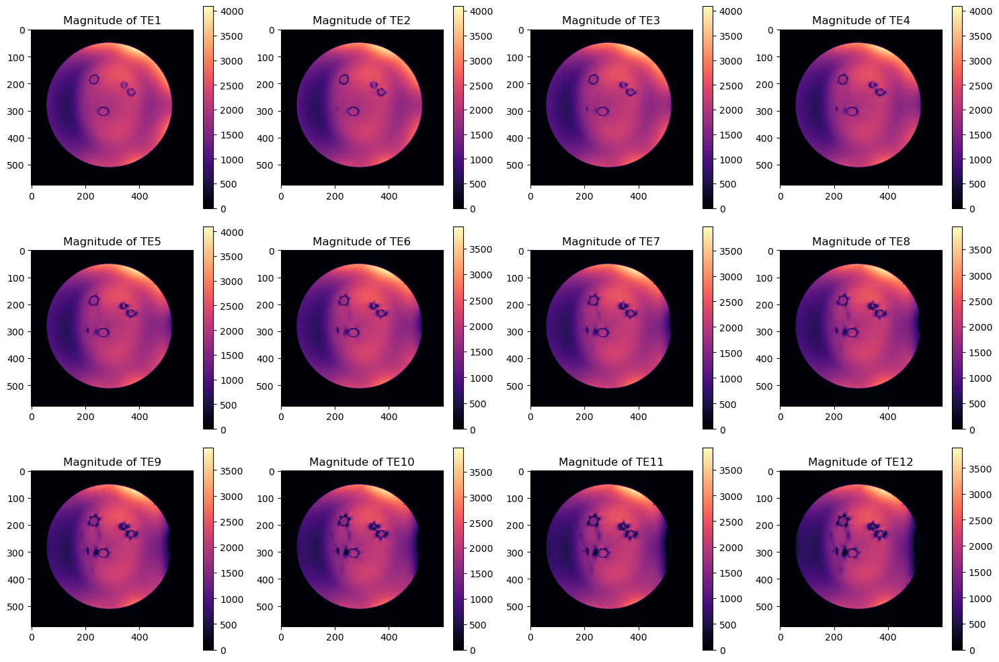

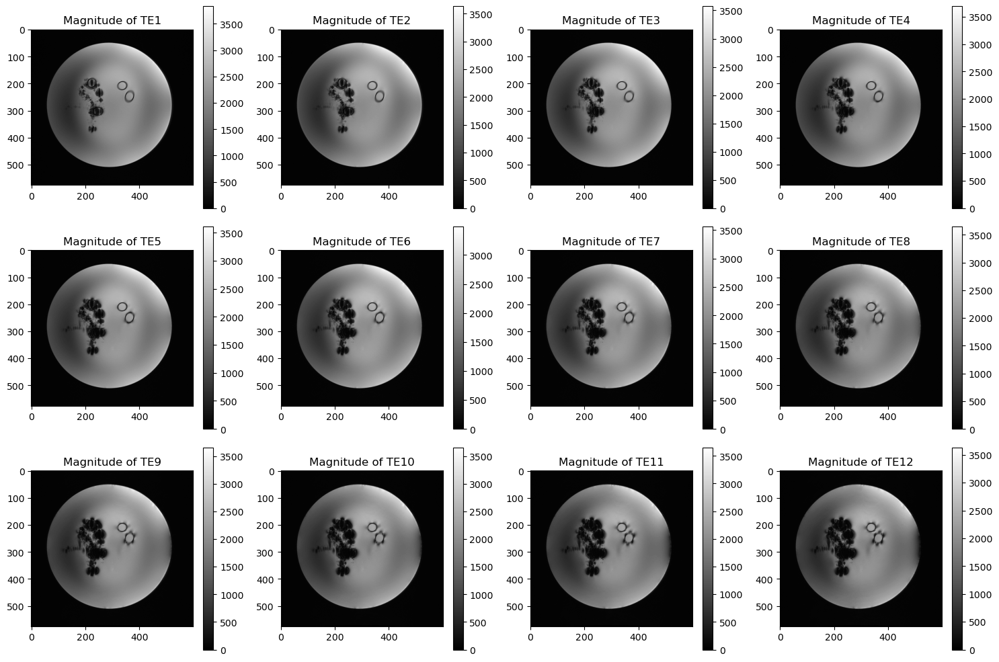

In [46]:
mag_12TE_mouthwash_soap_empty = [nib.load(path_12TE_mouthwash_soap_empty[i]).get_fdata() for i in range(12)]

plt.figure('12TE mouthwash_soap_empty', figsize=(15,10))

for i in range(len(mag_12TE_mouthwash_soap_empty)):
    plt.subplot(3,4,i+1)
    plt.imshow(mag_12TE_mouthwash_soap_empty[i][:,:,12] , cmap='magma')
    plt.colorbar()
    plt.title(f'Magnitude of TE{i+1}')

plt.tight_layout()

print(np.shape(mag_12TE_mouthwash_soap_empty[0]))
plt.show()

plt.figure('12TE', figsize=(15,10))

for i in range(len(mag_12TE_mouthwash_soap_empty)):
    plt.subplot(3,4,i+1)
    plt.imshow(mag_12TE_mouthwash_soap_empty[i][:,:,9] , cmap='gray')
    plt.colorbar()
    plt.title(f'Magnitude of TE{i+1}')

plt.tight_layout()


In [47]:
###### Cooridnates of the center of each sample in multiecho"#######"
## Mouthwaash 1 2 soap and empty ###
x_mouthwash1_multi, y_mouthwash1_multi, z_mouthwash1_multi = 326, 208, 7
x_mouthwash2_multi, y_mouthwash2_multi, z_mouthwash2_multi = 355, 262, 7
x_soap_multi, y_soap_multi, z_soap_multi = 229, 187, 12
x_empty_multi, y_empty_multi, z_empty_multi = 263, 304, 12

# ### Sugar ###
# x_sugar_c1_multi, y_sugar_c1_multi, z_sugar_c1_multi = 242, 179, 7
# x_sugar_c2_multi, y_sugar_c2_multi, z_sugar_c2_multi = 379, 254, 7
# x_sugar_c3_multi, y_sugar_c3_multi, z_sugar_c3_multi = 190, 323, 7
# x_melange_multi, y_melange_multi, z_melange_multi = 360, 331, 7


dx_multi, dy_multi, dz_multi = 10, 10, 3
###########################################################""

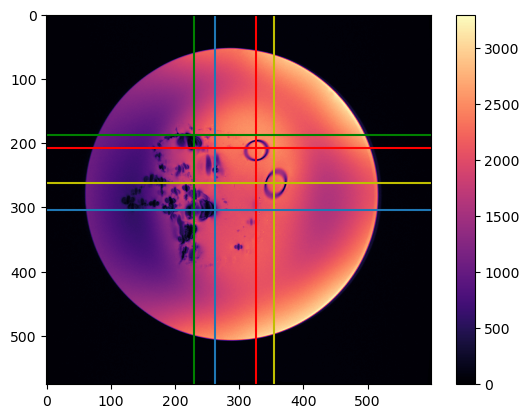

In [48]:
plt.figure()
plt.imshow(mag_12TE_mouthwash_soap_empty[0][:,:, z_mouthwash1_multi] , cmap='magma')
plt.colorbar()

plt.axvline(x=x_mouthwash1_multi, c='r')
plt.axvline(x=x_mouthwash2_multi, c='y')
plt.axvline(x=x_soap_multi, c='g')
plt.axvline(x=x_empty_multi)

plt.axhline(y=y_mouthwash1_multi, c='r')
plt.axhline(y=y_mouthwash2_multi, c='y')
plt.axhline(y=y_soap_multi, c='g')
plt.axhline(y=y_empty_multi)



In [49]:
def T2_calcul(mag_12TE,y = 180, x=150, z=5, plot_and_print=True):
    '''
    Compute the $T_2^*$ and associated $R^2$ value in one voxel

    Parameters
    ----------
    mag_12TE : numpy.ndarray
        4D array of the magnitudes of the 12 echos.
    y : int, optional
        y coordinate of the voxel. The default is 180.
    x : int, optional
        x coordinate of the voxel. The default is 150.
    z : int, optional
        z coordinate of the voxel. The default is 5.
    plot_and_print : bool, optional
        if True, print the results and plot the selected voxel and the fit. the default is True.
    

    Returns
    -------
    (T2_star, rSquared) : tulle of int
        tulle of the $T_2^*$ and associated $R^2$ of the selected voxel.

    '''
    m,n,p = np.shape(mag_12TE[0])
    TE = np.array([7.40, 14, 20.28, 27.20, 33.80, 40.4, 47, 53.6, 60.2, 66.8, 73.4, 80]) #ms
    echo = np.array([mag_12TE[i][y][x][int(z)] for i in range(12)])  #we first try t find the T2 value on one voxel

    def monoExp(t, A, T2_star, b):
        return A * np.exp(-t / T2_star) +b

    # perform the fit
    # p0 = (1, 1) # start with values near those we expect
    params, cv = scipy.optimize.curve_fit(monoExp, TE, echo, bounds=(0, [5000, 3000, 500]), maxfev=5000)
    A, T2_star, b = params

    # determine quality of the fit
    squaredDiffs = np.square(echo - monoExp(TE, A, T2_star, b))
    squaredDiffsFromMean = np.square(echo - np.mean(echo))
    rSquared = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)


    if plot_and_print == True:
        plt.figure()
        plt.imshow(mag_12TE[0][:,:,int(z)])
        plt.axvline(x=x)
        plt.axhline(y=y)
        plt.colorbar()

        plt.figure()
        plt.plot(TE, echo, "+")
        plt.plot(TE, monoExp(TE, A, T2_star, b), '--', label="fitted")
        plt.title("Fitted Exponential Curve")
        print(f'parameters = {params}')
        print(f"R² = {rSquared}")
    
        # inspect the parameters
        print(f"echo = {A} * e^(-t/{T2_star}) +{b}")
    
    return (T2_star, rSquared)

parameters = [2.32699197e+03 9.91788322e+02 1.79402719e-10]
R² = 0.9152293522613025
echo = 2326.9919748154803 * e^(-t/991.7883217357164) +1.7940271875493616e-10


(991.7883217357164, 0.9152293522613025)

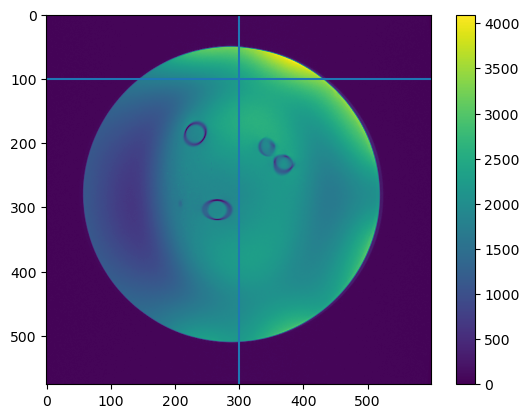

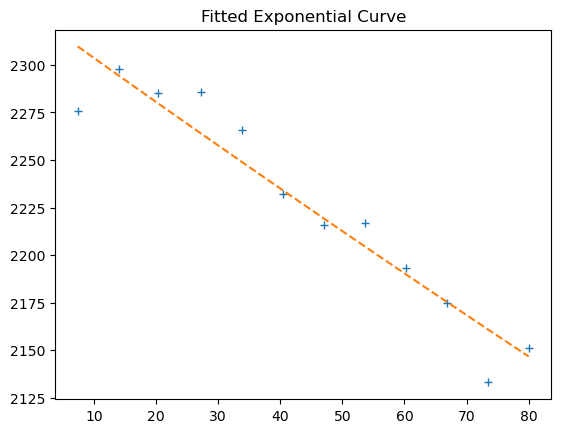

In [50]:
T2_calcul(mag_12TE_mouthwash_soap_empty, x=300, y=100, z= z_soap_multi)

parameters = [1.93418357e+03 3.11062555e+02 2.33500214e-16]
R² = 0.9637354485609597
echo = 1934.1835680893498 * e^(-t/311.0625553607354) +2.3350021433902716e-16


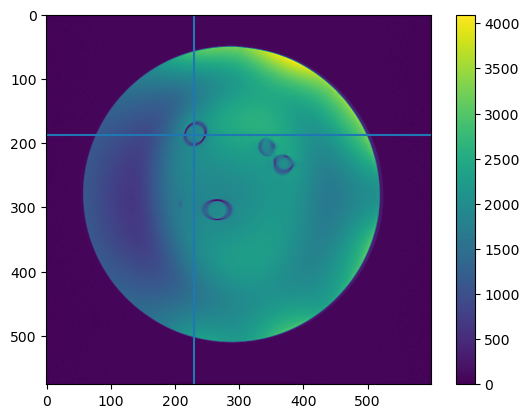

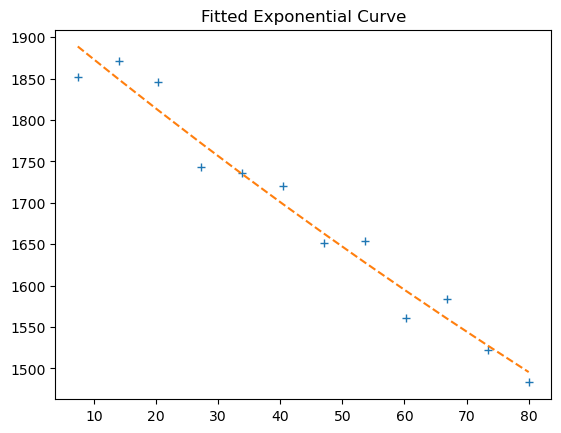

In [51]:
T2_soap, r_soap = T2_calcul(mag_12TE_mouthwash_soap_empty, x=x_soap_multi, y=y_soap_multi, z= z_soap_multi)

parameters = [1477.41307013  980.20650053  500.        ]
R² = 0.8160369079065896
echo = 1477.41307012744 * e^(-t/980.2065005252066) +499.9999999995436


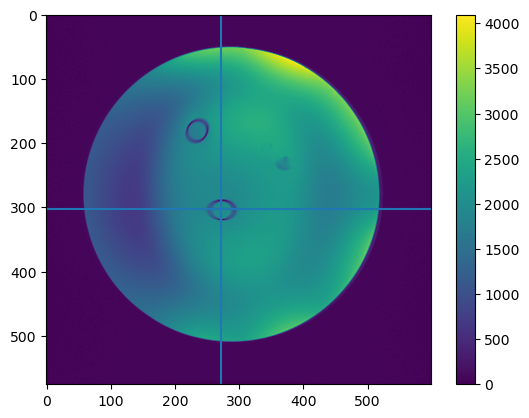

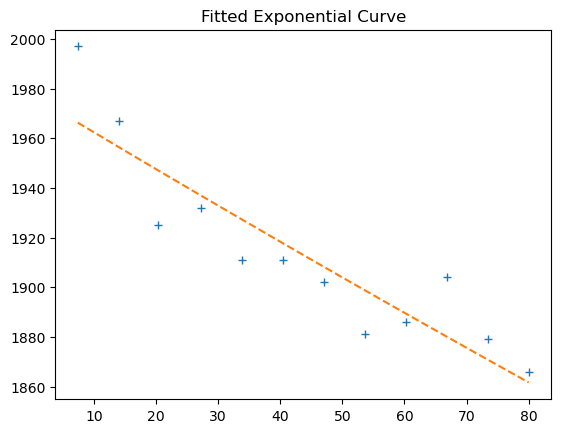

In [52]:
T2_empty, r_empty = T2_calcul(mag_12TE_mouthwash_soap_empty, x=x_empty_multi+9, y=y_empty_multi-1, z= z_empty_multi+1)

parameters = [2.49980162e+03 1.07796161e+03 5.02163565e-19]
R² = 0.9450816256644821
echo = 2499.8016180173954 * e^(-t/1077.9616131580237) +5.021635654977732e-19


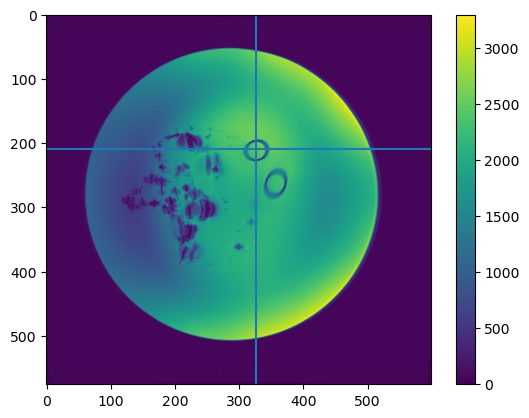

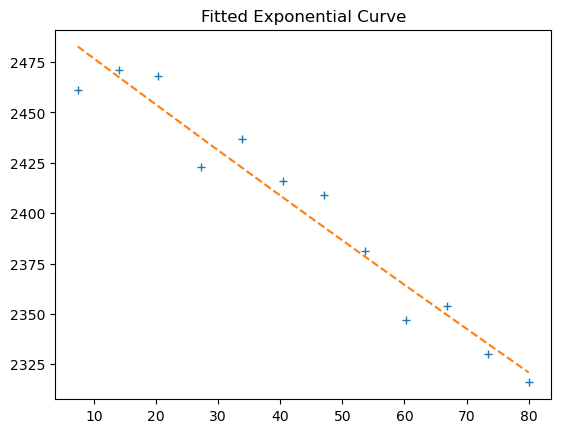

In [53]:
T2_mouthwash1, r_mouthwash1 = T2_calcul(mag_12TE_mouthwash_soap_empty, x=x_mouthwash1_multi+1, y=y_mouthwash1_multi+1, z= z_mouthwash1_multi)

parameters = [2.20848024e+03 1.46597963e+03 3.13914208e-05]
R² = 0.8530687202883372
echo = 2208.480239734371 * e^(-t/1465.9796275605033) +3.1391420752899655e-05


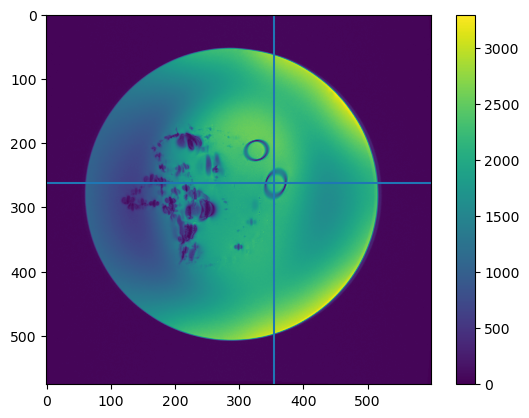

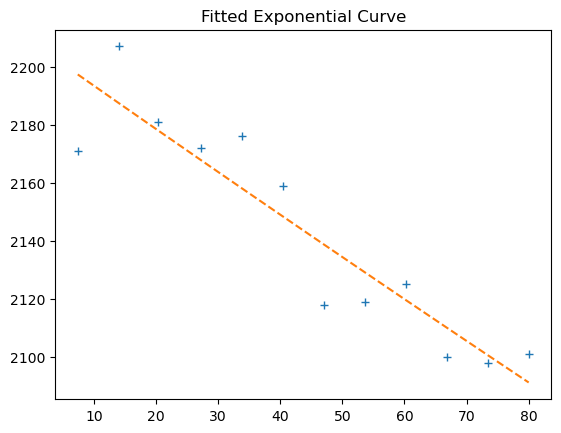

In [54]:
T2_mouthwash2, r_mouthwash2 = T2_calcul(mag_12TE_mouthwash_soap_empty, x=x_mouthwash2_multi, y=y_mouthwash2_multi, z= z_mouthwash2_multi)

parameters = [2051.55250026   20.05179164   64.34372441]
R² = 0.9853162399059906
echo = 2051.5525002586915 * e^(-t/20.051791643836232) +64.3437244050618


(20.051791643836232, 0.9853162399059906)

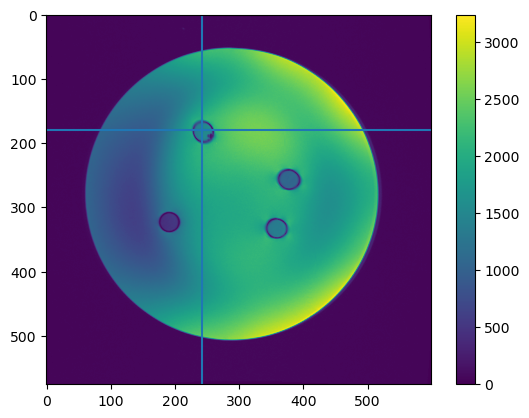

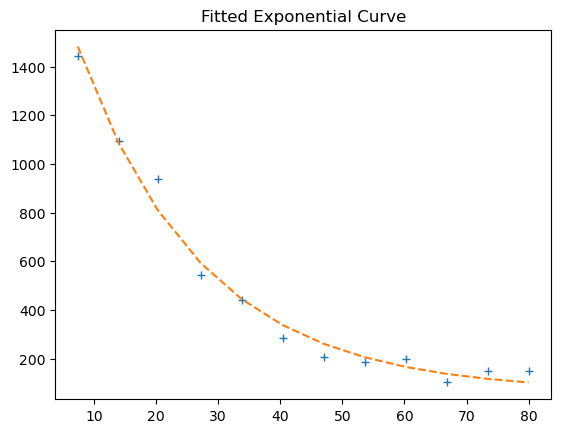

In [55]:
T2_calcul(mag_12TE=mag_12TE_sugar,y = y_sugar_c1_multi, x=x_sugar_c1_multi, z=z_sugar_c1_multi, plot_and_print=True)

In [56]:
fig = go.Figure(data=[go.Table(
    header=dict(values=['sugar concentration', 'T2_star', '$R^2$', 'susceptibility impact', '$R^2$'],
                line_color ='darkslategray',
                fill_color='lightskyblue',
                align='left'),
    cells=dict(values=[['water', '350g/L sugar', '550g/L sugar', '750g/L sugar', '750g/L sugar + mouthwash', '530g/L sugar+soap + vertebrae inside', '~6% mouthwash 1', '~6% mouthwash 2', '~50% soap', 'empty/blank'], # 1st column
                       ['~500 to 750ms',20,9.2, 8, 25, 5, T2_mouthwash1, T2_mouthwash2, T2_soap, T2_empty], 
                      ['variable but ~0.97',  0.98,  0.98,  0.98, 0.98, 'variable but ~0.9-', r_mouthwash1, r_mouthwash2, r_soap, r_empty],
                       [0, -115.6, -143, -198, -200, '', -27, -45.6, -54.9, -18],
                      ['',0.788, 0.69, 0.8, 0.83, '', 0.37, 0.54, 0.69, 0.083]],
               line_color='darkslategray',
               fill_color='lightcyan',
               align='left'))
])

fig.update_layout(width=1000, height=500)
fig.show()

In [57]:
def calcT2_star_avg(mag_12TE,y, x, z, plot_and_print=True, radius=5, R_square_min = 0.8):
    '''
    Compute the averaged $T_2^*$ inside a circle for voxels and reject those with a low associated $R^2$.

    Parameters
    ----------
    mag_12TE : numpy.ndarray
        4D array of the magnitudes of the 12 echos.
    y : int
        y coordinate of the voxel. 
    x : int
        x coordinate of the voxel. 
    z : int
        z coordinate of the voxel. 
    plot_and_print : bool, optional
        if True, print the results and plot the selected circle. The default is True.
    radius : int
        radius of the circle
    R_square_min : float, optional
        minimum $R^2$ value to keep select a voxel. The default is 0.8.

    Returns
    -------
    (avg, std, len(T2_red)) : tulle of floats
        tulle of the mean, standard deviation of $T_2^*$ and number of selected voxels inside the circle

    '''
    T2_star_vec = []
    r_squarred_vec = []
    array_to_plot  = np.copy(mag_12TE[0])
    for i in range(radius*2):
        for j in range(radius*2):
            if (radius - i)**2+(radius-j)**2 < radius**2:
                T2_star, r_squ = T2_calcul(mag_12TE,y = y+radius-j, x=x+radius-i, z=z, plot_and_print=False)
                T2_star_vec.append(T2_star)
                r_squarred_vec.append(r_squ)
                array_to_plot[y+radius-j][x+radius-i][z] = 10000
    if plot_and_print == True:
        plt.figure()
        plt.imshow(array_to_plot[:,:,z])
    
    weights = (np.array(r_squarred_vec)>R_square_min) #we considere only the values that gave a sufficient R**2
    T2_red = [t for i, t in enumerate(T2_star_vec) if r_squarred_vec[i]>R_square_min ]
    
    avg = np.average(np.array(T2_star_vec), weights = weights)
    avg_ = np.average(np.array(T2_red))
    std=np.std(np.array(T2_red))
    print(f'weighted mean value of $T_2^* from numpy: {avg}')
    print(f'standard deviation value: {std}')
    print(f'number of values satisfying $R^2>R^2$: {len(T2_red)}')
    return(avg, std, len(T2_red))

weighted mean value of $T_2^* from numpy: 20.959085004736217
standard deviation value: 0.8875413011244053
number of values satisfying $R^2>R^2$: 140


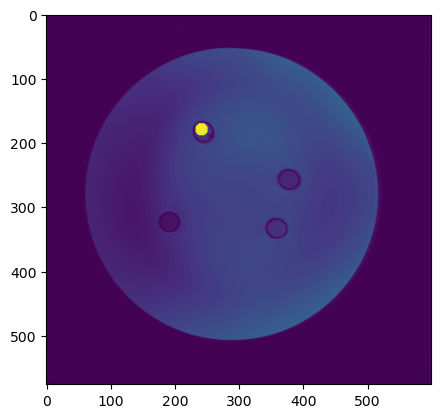

In [58]:
T2_avg_sugar_c1, std_sugar_c1, N_sugar_c1 = calcT2_star_avg(mag_12TE=mag_12TE_sugar,y = y_sugar_c1_multi, x=x_sugar_c1_multi, z=z_sugar_c1_multi, plot_and_print=True, radius=10, R_square_min=0.99)

weighted mean value of $T_2^* from numpy: 9.125941928578216
standard deviation value: 0.6849592167111661
number of values satisfying $R^2>R^2$: 24


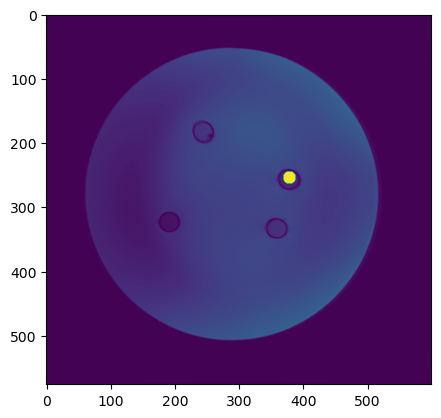

In [59]:
T2_avg_sugar_c2, std_sugar_c2, N_sugar_c2 = calcT2_star_avg(mag_12TE=mag_12TE_sugar,y = y_sugar_c2_multi, x=x_sugar_c2_multi, z=z_sugar_c2_multi, plot_and_print=True, radius=10, R_square_min=0.99)

weighted mean value of $T_2^* from numpy: 7.967980376436489
standard deviation value: 0.5530291029734662
number of values satisfying $R^2>R^2$: 168


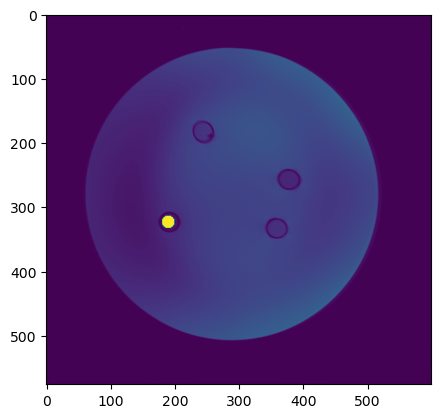

In [60]:
T2_avg_sugar_c3, std_sugar_c3, N_sugar_c3 = calcT2_star_avg(mag_12TE=mag_12TE_sugar,y = y_sugar_c3_multi, x=x_sugar_c3_multi, z=z_sugar_c3_multi, plot_and_print=True, radius=10, R_square_min=0.98)

weighted mean value of $T_2^* from numpy: 26.2418166893127
standard deviation value: 1.072565874554563
number of values satisfying $R^2>R^2$: 279


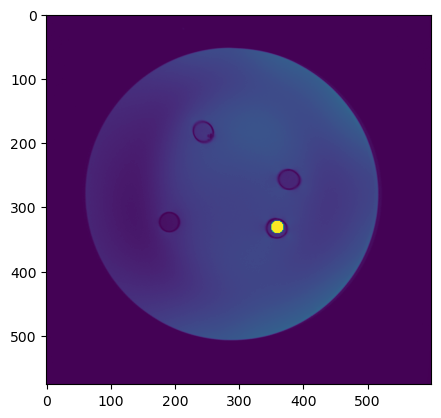

In [61]:
T2_avg_sugar_melange, std_sugar_melange, N_sugar_melange = calcT2_star_avg(mag_12TE=mag_12TE_sugar,y = y_melange_multi, x=x_melange_multi, z=z_melange_multi, plot_and_print=True, radius=10, R_square_min=0.98)

weighted mean value of $T_2^* from numpy: 236.26032117693853
standard deviation value: 16.052045660368062
number of values satisfying $R^2>R^2$: 197


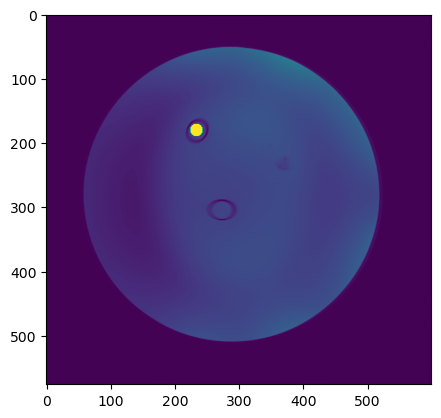

In [62]:
T2_avg_soap, std_soap, N_soap = calcT2_star_avg(mag_12TE=mag_12TE_mouthwash_soap_empty,y = y_soap_multi-7, x=x_soap_multi+5, z=z_soap_multi+1, plot_and_print=True, radius=10, R_square_min=0.97)

weighted mean value of $T_2^* from numpy: 563.2987700178096
standard deviation value: 332.8911819863435
number of values satisfying $R^2>R^2$: 46


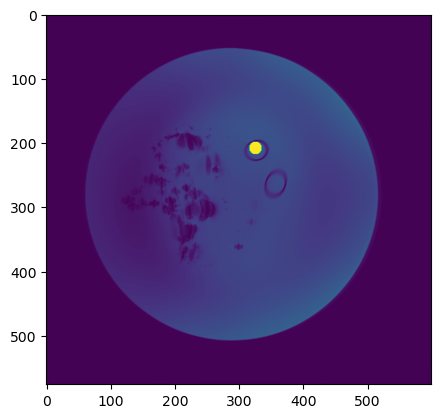

In [63]:
T2_avg_mouthwash1, std_mouthwash1, N_mouthwash1 = calcT2_star_avg(mag_12TE=mag_12TE_mouthwash_soap_empty,y = y_mouthwash1_multi, x=x_mouthwash1_multi, z=z_mouthwash1_multi, plot_and_print=True, radius=10, R_square_min=0.93)

weighted mean value of $T_2^* from numpy: 890.7399108729339
standard deviation value: 174.15470469771373
number of values satisfying $R^2>R^2$: 20


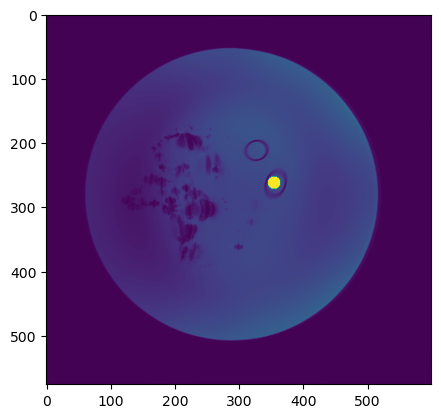

In [64]:
T2_avg_mouthwash2, std_mouthwash2, N_mouthwas2 = calcT2_star_avg(mag_12TE=mag_12TE_mouthwash_soap_empty,y = y_mouthwash2_multi, x=x_mouthwash2_multi, z=z_mouthwash2_multi, plot_and_print=True, radius=10, R_square_min=0.93)

weighted mean value of $T_2^* from numpy: 747.1712818273883
standard deviation value: 172.6649012216596
number of values satisfying $R^2>R^2$: 17


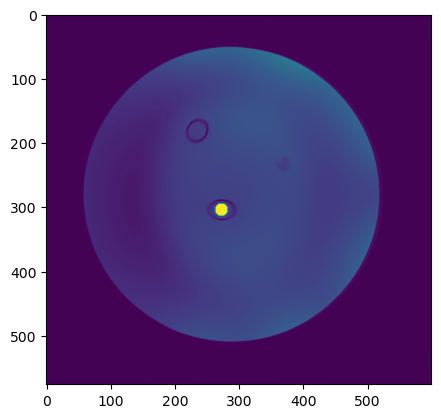

In [65]:
T2_avg_empty, std_empty, N_empty = calcT2_star_avg(mag_12TE=mag_12TE_mouthwash_soap_empty,y = y_empty_multi, x=x_empty_multi+10, z=z_empty_multi+1, plot_and_print=True, radius=10, R_square_min=0.90)

weighted mean value of $T_2^* from numpy: 976.2409833796669
standard deviation value: 210.03389723607927
number of values satisfying $R^2>R^2$: 194


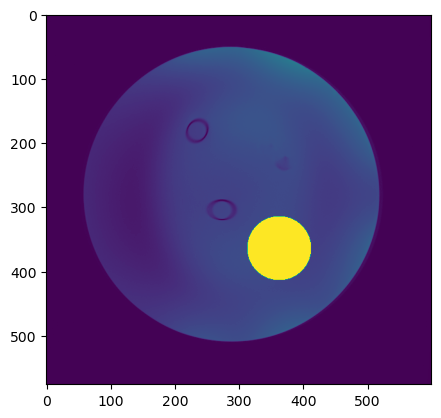

In [66]:
T2_avg_water, std_water, N_water = calcT2_star_avg(mag_12TE=mag_12TE_mouthwash_soap_empty,y = y_empty_multi+60, x=x_empty_multi+100, z=z_empty_multi+1, plot_and_print=True, radius=50, R_square_min=0.96)

weighted mean value of $T_2^* from numpy: 784.9025512365494
standard deviation value: 203.79854075972625
number of values satisfying $R^2>R^2$: 396


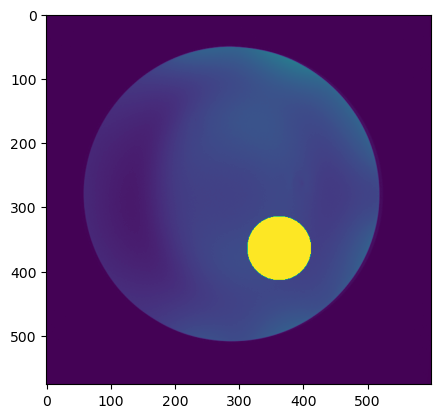

In [67]:
T2_avg_water, std_water, N_water = calcT2_star_avg(mag_12TE=mag_12TE_sugar,y = y_empty_multi+60, x=x_empty_multi+100, z=z_empty_multi+1, plot_and_print=True, radius=50, R_square_min=0.96)